this starts with the functions created in 260609, but i want to test different variance thresholds to see what percentage of oids that pass thru the query filter (obs w/in last 50 days, mag btwn 17 and 22, and at least 1 lsst alert) will pass at the different variance thresholds. i also want to try with snr things (variance, median, mean, maybe other things?)

In [1]:
from antares_devkit.models import BaseFilter
from antares_devkit.models import DevKitLocus
from antares_client import search
import numpy as np
import matplotlib.pyplot as plt
from astropy.time import Time
import pandas as pd
import math
from astropy.coordinates import Angle, SkyCoord
import astropy.units as u

t_now = Time.now().mjd

In [245]:
#extract data from lsst alert
def lsst_alert(alert):
    obs_date = float(alert.properties['lsst_diaSource_midpointMjdTai'])
    oid_mag = float(-2.5*np.log10(alert.properties['lsst_diaSource_scienceFlux']) + 31.4)
    temp_mag = float(-2.5*np.log10(alert.properties['lsst_diaSource_templateFlux']) + 31.4)
    diff_mag = float(temp_mag - oid_mag)
    snr = float(alert.properties['lsst_diaSource_snr'])
    
    bandpass = alert.properties['lsst_diaSource_band']
    band = 'lsst_' + str(bandpass)

    if alert.properties['lsst_diaSource_isNegative'] == True:
        pos_or_neg = -1
    else:
        pos_or_neg = 1
        
    return {band: [obs_date, oid_mag, temp_mag, diff_mag, pos_or_neg, snr]}

def lsst_quality(alert):
    quality = True
    quality &= alert.properties['lsst_diaSource_reliability'] >= 0.6
    quality &= alert.properties['lsst_diaSource_psfFlux_flag'] == False
    quality &= alert.properties['lsst_diaSource_centroid_flag'] == False
    quality &= alert.properties['lsst_diaSource_shape_flag'] == False
    quality &= alert.properties['lsst_diaSource_isDipole'] == False
    quality &= alert.properties['lsst_diaSource_pixelFlags_saturated'] == False
    quality &= alert.properties['lsst_diaSource_pixelFlags_edge'] == False
    quality &= alert.properties['lsst_diaSource_pixelFlags_cr'] == False
    quality &= alert.properties['lsst_diaSource_pixelFlags_streak'] == False

    if 'lsst_diaSource_ssObjectId' in alert.properties:
        quality &= alert.properties['lsst_diaSource_ssObjectId'] in (0, None, "0")
    return quality

#extract data from ztf alert
#uses formula from 260609 6/15 markdown cell
def ztf_alert(alert):
    bands = ['x', 'g', 'R', 'i']
    
    band_id = alert.properties['ztf_fid']
    obs_date = float(alert.properties['ant_mjd'])
    ant_mag = alert.properties['ant_mag']
    temp_mag = alert.properties['ztf_magnr']
    diff_img_mag = alert.properties['ztf_magpsf']
    
    if alert.properties['ztf_isdiffpos'] == 'f' or alert.properties['ztf_isdiffpos'] == 0:
        diff_mag = -2.5* np.log10(1 - 10.**(0.4*(temp_mag - diff_img_mag)))
        pos_or_neg = -1
    else:
        diff_mag = -2.5* np.log10(10.**(0.4*(temp_mag - diff_img_mag)) + 1)
        pos_or_neg = 1

    oid_mag = diff_mag + temp_mag
    oid_snr = float(1.0857 / alert.properties['ztf_sigmapsf'])

    band = 'ztf_' + str(bands[band_id])
    return {band: [obs_date, oid_mag, temp_mag, ant_mag, pos_or_neg, oid_snr]}

#checks ztf alert for good quality
def ztf_quality(alert):
    quality = True
    quality &= alert.properties['ztf_rb'] >= 0.65
    quality &= alert.properties['ztf_nbad'] == 0
    quality &= alert.properties['ztf_fwhm'] <= 5
    quality &= alert.properties['ztf_elong'] <= 1.2
    quality &= abs(alert.properties['ztf_magdiff']) <= 0.1
    return quality

#unpacks all alerts (that pass a quality test)
def oid_get_info(alerts):
    oid = {'lsst_g': 0, 'lsst_r': 0, 'lsst_i': 0, 'lsst_z': 0, 'lsst_u': 0, 'lsst_y': 0, 
               'ztf_g': 0, 'ztf_R': 0, 'ztf_i': 0}
    
    for alert in alerts:
        if alert.properties['ant_survey'] == 4:
            lsst_pass = lsst_quality(alert)
            if lsst_pass == True:
                comp = lsst_alert(alert)
            else:
                continue
        elif alert.properties['ant_survey'] == 1:
            ztf_pass = ztf_quality(alert)
            if ztf_pass == True:
                comp = ztf_alert(alert)
            else:
                continue
        else:
            continue
            
        band = [*comp][0]
        
        if oid[band] == 0:
            oid_df = pd.DataFrame([comp[band]], columns = ['mjd', 'oid_mag', 'template_mag', 'diff_mag', 'pos/neg', 'snr'])
            oid[band] = {'data': oid_df}
            continue
        else:
            data_df = pd.DataFrame([comp[band]], columns = ['mjd', 'oid_mag', 'template_mag', 'diff_mag', 'pos/neg', 'snr'])
            current_data = oid[band]['data']
            oid[band]['data'] = pd.concat([current_data, data_df]).drop_duplicates().reset_index(drop=True)
    return oid

#get latest mjd for an oid
def get_latest_mjd(oid):
    latest_mjd = 0
    for band in oid:
        if oid[band] == 0:
            continue
            
        if latest_mjd < oid[band]['data']['mjd'].iloc[-1]:
            latest_mjd = oid[band]['data']['mjd'].iloc[-1]
    return latest_mjd

#get earliest mjd for an oid
def get_earliest_mjd(oid):
    earliest_mjd = 1000000
    for band in oid:
        if oid[band] == 0:
            continue
        if earliest_mjd > oid[band]['data']['mjd'].iloc[0]:
            earliest_mjd = oid[band]['data']['mjd'].iloc[0]
    return earliest_mjd

#check if oid passes variance threshold
def var_check(locus, day_lim, var_thresh):
    check = 0
    oid = oid_get_info(locus.alerts)
    latest_mjd = get_latest_mjd(oid)
    for band in oid:
        if oid[band] == 0:
            continue

        recent_obs = oid[band]['data'][oid[band]['data']['mjd'] >= float(latest_mjd) - day_lim].index.tolist()

        if len(recent_obs) > 2: #if +3 alerts w/in day_lim of latest_mjd, then we look at the variance + hyper_v (only including alerts w/in time frame)
            temp_var = float(np.var(oid[band]['data']['template_mag']))
            if temp_var >= 0.01:
                continue
            
            here_var = float(np.var(oid[band]['data']['oid_mag'][recent_obs[0]:]))
            here_diffs = float(np.median(oid[band]['data']['diff_mag'][recent_obs[0]:]))  
            oid[band]['variance'] = here_var
            
            if here_var > 0:
                var_diff = float(here_diffs/here_var)
                oid[band]['var_diff_rat'] = var_diff
        
            if here_var >= var_thresh:
                check += 1

    if check > 0:
        return oid

#check is oid passes difference threshold
def diff_check(locus, day_lim, diff_thresh):
    check = 0
    oid = oid_get_info(locus.alerts)
    latest_mjd = get_latest_mjd(oid)
    for band in oid:
        if oid[band] == 0:
            continue

        recent_obs = oid[band]['data'][oid[band]['data']['mjd'] >= float(latest_mjd) - day_lim].index.tolist()

        if len(recent_obs) > 2: #if +3 alerts w/in day_lim of latest_mjd, then we look at the variance + hyper_v (only including alerts w/in time frame)
            temp_var = float(np.var(oid[band]['data']['template_mag']))
            if temp_var >= 0.01:
                continue

            here_diffs = float(np.median(oid[band]['data']['diff_mag'][recent_obs[0]:])) 
            oid[band]['diff_med'] = here_diffs

            if here_diffs >= diff_thresh:
                check += 1

    if check > 0:
        return oid

#check is oid passes snr threshold
def snr_check(locus, day_lim, snr_thresh):
    check = 0
    oid = oid_get_info(locus.alerts)
    latest_mjd = get_latest_mjd(oid)
    for band in oid:
        if oid[band] == 0:
            continue

        recent_obs = oid[band]['data'][oid[band]['data']['mjd'] >= float(latest_mjd) - day_lim].index.tolist()

        if len(recent_obs) > 2: #if +3 alerts w/in day_lim of latest_mjd, then we look at the variance + hyper_v (only including alerts w/in time frame)
            temp_var = float(np.var(oid[band]['data']['template_mag']))
            if temp_var >= 0.01:
                continue

            here_snrs = float(np.median(oid[band]['data']['snr'][recent_obs[0]:])) 
            oid[band]['snr_med'] = here_snrs

            if here_snrs >= snr_thresh:
                check += 1

    if check > 0:
        return oid

In [305]:
mag_max = 22
mag_min = 17

q_lsst_magcut = {
    "query": {
        "bool": {
            "filter": [
                { "range": { "properties.newest_alert_observation_time": { "gte": t_now-50} } },
                { "range": { "properties.newest_alert_magnitude": { "lte": mag_max, "gte": mag_min} } },
                { "exists": { "field": "properties.survey.lsst" } },
             ]
        }
    }
}

loci = []
oids_sample = {}
# oids_var[0.4] = {}
for locus in search.search(q_lsst_magcut):
    oid_dv = locus.to_devkit()
    oid_locus = DevKitLocus.model_validate(oid_dv)

    oid_here = oid_get_info(oid_locus.alerts)
    oids_sample[oid_dv['id']] = oid_here
    # loci.append(oid_locus)
    
    # high_var_oid = oid_var_check(oid_locus.alerts, 20, 0.4)

    # if high_var_oid == None:
    #     continue

    # oids_var[0.4][oid_dv['id']]= high_var_oid
    
    if len(oids_sample) >= 10000:
        break

/var/folders/ym/gbj1z46s0wg5zdmkkq0xpptr0000gs/T/ipykernel_6520/3994388418.py:47: RuntimeWarning: invalid value encountered in log10
  diff_mag = -2.5* np.log10(1 - 10.**(0.4*(temp_mag - diff_img_mag)))
/var/folders/ym/gbj1z46s0wg5zdmkkq0xpptr0000gs/T/ipykernel_6520/3994388418.py:4: RuntimeWarning: invalid value encountered in log10
  oid_mag = float(-2.5*np.log10(alert.properties['lsst_diaSource_scienceFlux']) + 31.4)
/var/folders/ym/gbj1z46s0wg5zdmkkq0xpptr0000gs/T/ipykernel_6520/3994388418.py:5: RuntimeWarning: invalid value encountered in log10
  temp_mag = float(-2.5*np.log10(alert.properties['lsst_diaSource_templateFlux']) + 31.4)


In [306]:
len(oids_sample)

8780

In [53]:
fail_count = {'var': {}, 'diff_mag': {}, 'snr': {}}
var_threshes = [0.05, 0.1, 0.2, 0.3, 0.4]
for var_thresh in var_threshes:
    oids_var[var_thresh] = {}
    fail_here = 0
    for oid_locus in loci:
        high_var_oid = var_check(oid_locus, 20, var_thresh)
    
        if high_var_oid == None:
            fail_here += 1
            continue
        else:
            oids_var[var_thresh][oid_locus.id] = high_var_oid
    fail_count['var'][var_thresh] = fail_here
    print(f'{fail_here} oids failed, {len(oids_var[var_thresh])} oids ({100*len(oids_var[var_thresh])/(len(oids_var[var_thresh])+fail_here):.2f}%) passed the var check at a {var_thresh} threshold')
    

/var/folders/ym/gbj1z46s0wg5zdmkkq0xpptr0000gs/T/ipykernel_6520/4171029174.py:47: RuntimeWarning: invalid value encountered in log10
  diff_mag = -2.5* np.log10(1 - 10.**(0.4*(temp_mag - diff_img_mag)))


1744 oids failed, 423 oids (19.52%) passed the var check at a 0.05 threshold
1954 oids failed, 224 oids (10.28%) passed the var check at a 0.1 threshold
2112 oids failed, 75 oids (3.43%) passed the var check at a 0.2 threshold
2174 oids failed, 19 oids (0.87%) passed the var check at a 0.3 threshold
2189 oids failed, 5 oids (0.23%) passed the var check at a 0.4 threshold


In [41]:
oids_var

{0.4: {'ANT2020aopjg': {'lsst_g': {'data':             mjd    oid_mag  template_mag  diff_mag  pos/neg         snr
    0  61203.359971  17.913736     18.308458  0.394722        1  149.123306,
    'variance': 0,
    'var_diff_rat': 0},
   'lsst_r': 0,
   'lsst_i': 0,
   'lsst_z': 0,
   'lsst_u': 0,
   'lsst_y': 0,
   'ztf_g': {'data':               mjd    oid_mag  template_mag   diff_mag  pos/neg        snr
    0    58368.229873  20.193105     18.082001  18.249641       -1  13.751021
    1    58371.229826  17.330670     18.082001  18.084490        1  15.704720
    2    58634.445579  20.307246     18.082001  18.231701       -1  13.036744
    3    58637.480313  17.329125     18.082001  18.081400        1  10.247674
    4    58646.333461  18.920565     18.082001  18.754900       -1   8.094809
    ..            ...        ...           ...        ...      ...        ...
    137  61184.418067  17.183091     18.082001  17.806732        1  18.126170
    138  61196.458333  19.578679     18.0820

# 6/22
i want to test the filter on known tdes' lightcurves (and "false positive" tdes lightcurves) from [Yao et al.](https://ui.adsabs.harvard.edu/abs/2023ApJ...955L...6Y/abstract). in order to do this, i need to bring back (and fix) my moving window code to see at whatpoint would this filter let the oids pass

In [62]:
ids = ['ZTF18acaqdaa', 'ZTF18acnbpmd', 'ZTF19aabbnzo', 'ZTF19aaciohh', 'ZTF17aaazdba', 'ZTF19aakswrb', 'ZTF19aaniqrr', 
        'ZTF19aapreis', 'ZTF19aarioci', 'ZTF19abzrhgq', 'ZTF19acspeuw', 'ZTF20aabqihu', 'ZTF20abfcszi', 'ZTF20abgwfek',
        'ZTF20abnorit', 'ZTF20acaazkt', 'ZTF20achpcvt', 'ZTF20acitpfz', 'ZTF20acnznms', 'ZTF20acvezvs', 'ZTF20acwytxn', 
        'ZTF21aaaokyp', 'ZTF21aakfqwq', 'ZTF21aanxhjv', 'ZTF21aauuybx', 'ZTF21abaxaqq', 'ZTF21abcgnqn', 'ZTF21abhrchb',
        'ZTF21abjrysr', 'ZTF21abqhkjd', 'ZTF21abqtckk', 'ZTF21abxngcz', 'ZTF21acafvhf', 'ZTF18abavruc', 'ZTF20aaivego', 
       'ZTF20ackdkva', 'ZTF21abcmepi', 'ZTF21abwjibi', 'ZTF20aaurjbj', 'ZTF20aayxdse', 'ZTF20achuhlt', 'ZTF21aaglrzc', 
       'ZTF21abdmevk', 'ZTF21abzciqh', 'ZTF19abulzhy', 'ZTF20abgoocl', 'ZTF19acfwynw', 'ZTF20abobpcb', 'ZTF21aavdqgf', 
       'ZTF20aasuiks ', 'ZTF20acbcfaa', 'ZTF19abvgxrq', 'ZTF21abislwc', 'ZTF20aczhaeu', 'ZTF19aaywayr']

In [204]:
t_oids = {}
t_loci = {}
t_window = {}
for ztf_id in ids:
    locus = search.get_by_ztf_object_id(ztf_id)
    if locus == None:
        continue
        
    oid_dv = locus.to_devkit()
    oid_locus = DevKitLocus.model_validate(oid_dv)

    t_loci[oid_locus.id+' '+ztf_id] = oid_locus

    here_oid = oid_get_info(oid_locus.alerts)
    # print(oid_locus.id, ztf_id)
    # window_check = moving_window_var(here_oid, 40, 0.2)

    t_oids[oid_locus.id+' '+ztf_id] = here_oid
    # t_window[oid_locus.id] = window_check

In [210]:
t_oids

{'ANT2020akxwa ZTF18acaqdaa': {'lsst_g': 0,
  'lsst_r': 0,
  'lsst_i': 0,
  'lsst_z': 0,
  'lsst_u': 0,
  'lsst_y': 0,
  'ztf_g': {'data':              mjd    oid_mag  template_mag   diff_mag  pos/neg        snr
   0   58492.549826  18.249641         20.33  18.422501        1  10.720846
   1   58580.443113  18.843623         20.33  19.162300        1  10.086774
   2   58591.487037  18.923334         20.33  19.270599        1   6.073269
   3   58616.454722  18.865987         20.33  19.192400        1  11.047795
   4   58635.434421  18.934497         20.33  19.285999        1  11.939560
   5   58638.347014  18.913440         20.33  19.257000        1   9.342650
   6   58641.213530  18.901318         20.33  19.240400        1  10.028079
   7   58644.341794  18.952165         20.33  19.310499        1  10.013558
   8   58647.339537  18.926383         20.33  19.274799        1   8.493711
   9   58660.342222  18.997155         20.33  19.373600        1  10.053429
   10  58694.226875  19.1676

/var/folders/ym/gbj1z46s0wg5zdmkkq0xpptr0000gs/T/ipykernel_6520/2735025475.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8,4))


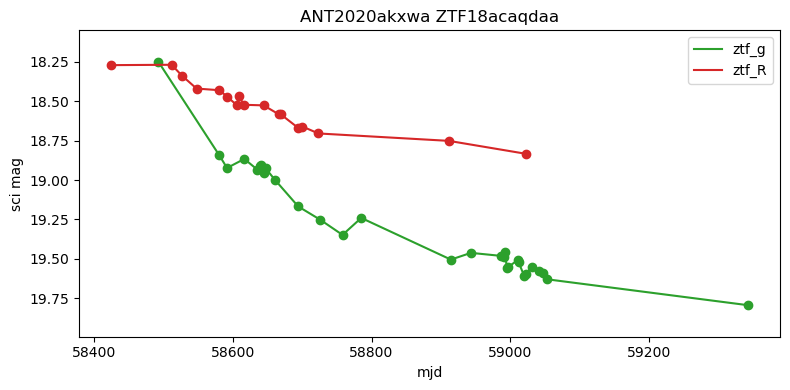

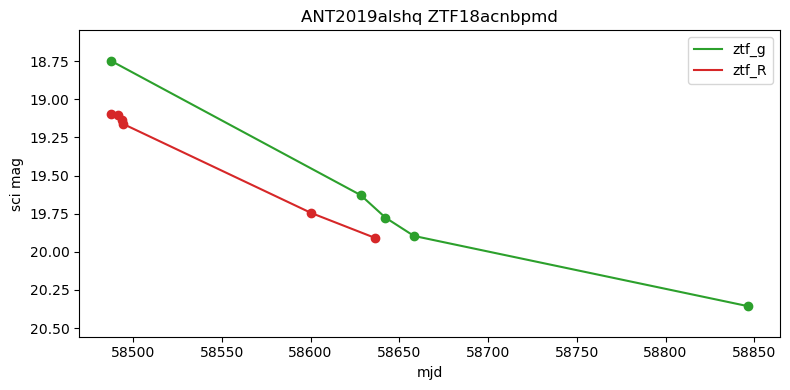

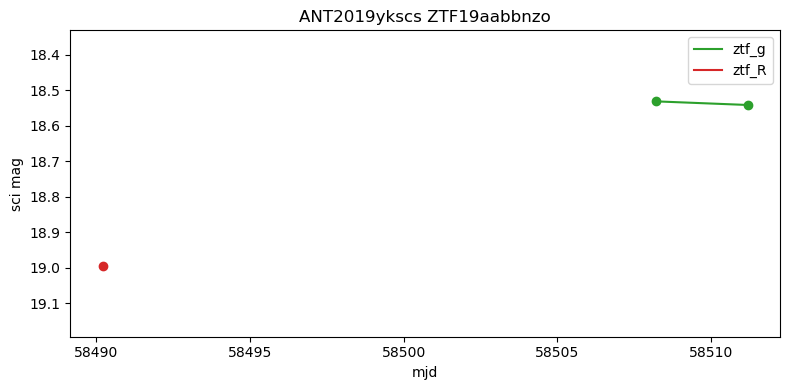

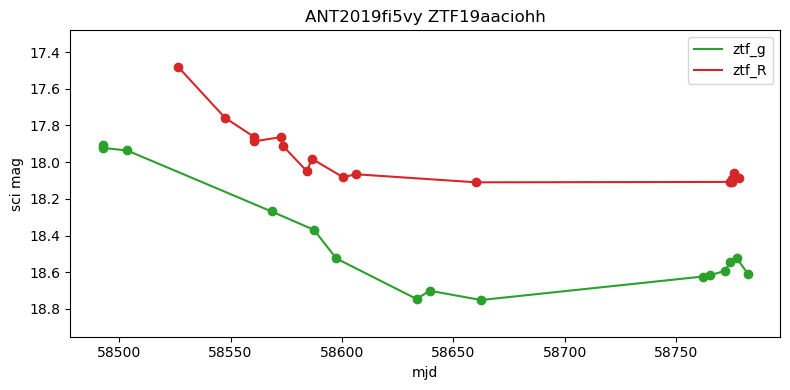

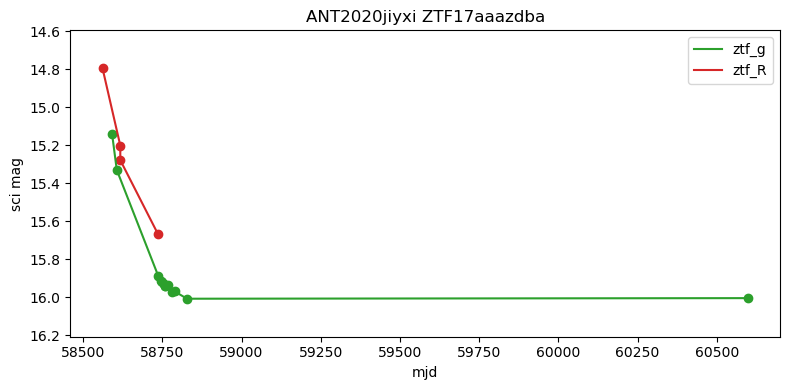

...

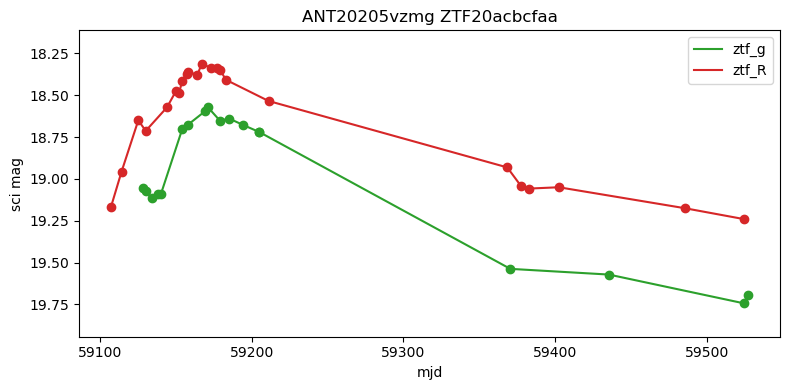

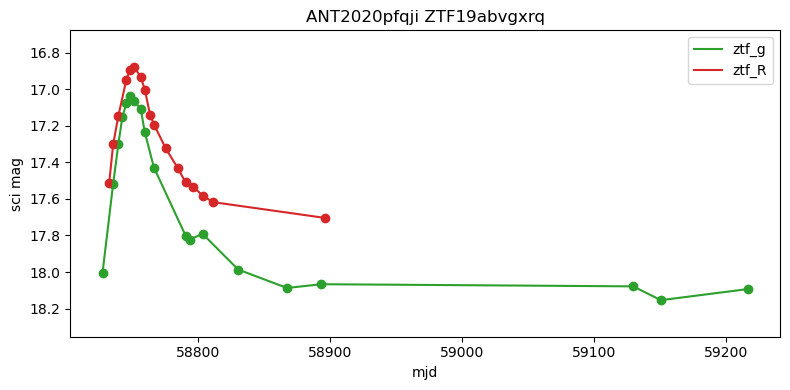

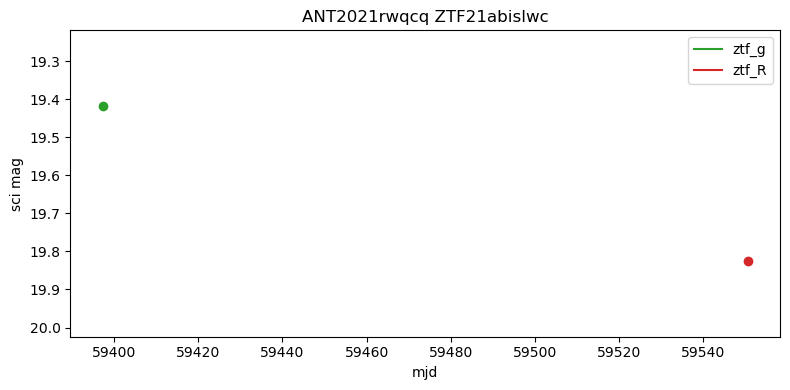

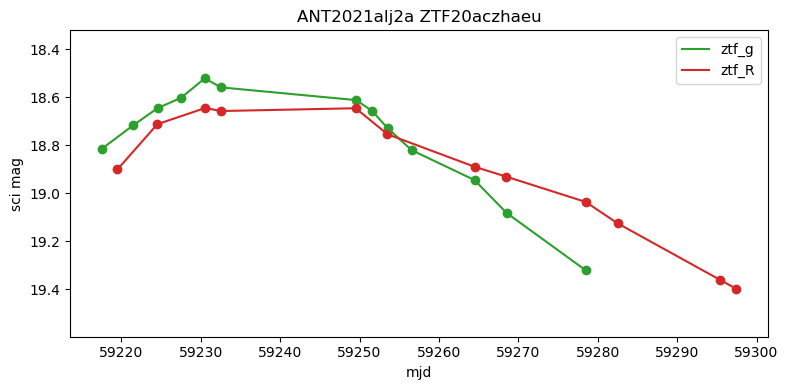

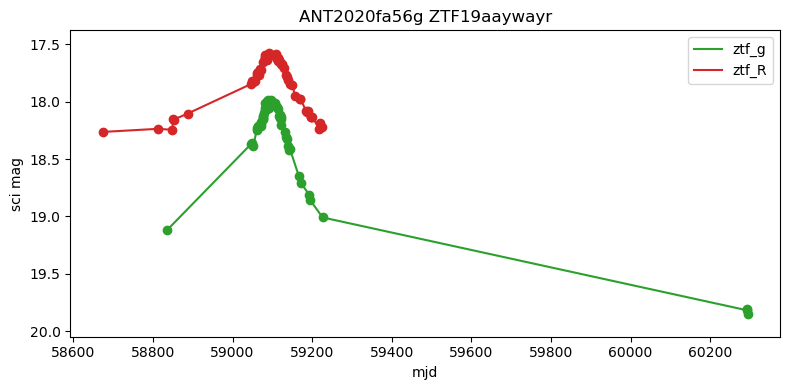

In [206]:
colors = {'lsst_g': 'tab:blue', 'lsst_r': 'tab:orange', 'lsst_i': 'tab:brown', 'lsst_z': 'tab:pink', 'lsst_u': 'tab:olive', 
          'lsst_y': 'tab:cyan' ,'ztf_g': 'tab:green', 'ztf_R': 'tab:red', 'ztf_i': 'tab:purple'}
for key in t_oids:
    fig, ax = plt.subplots(1,1, figsize=(8,4))
    max_mags = []
    min_mags = []
    for band in t_oids[key]:
        if t_oids[key][band] == 0:
            continue

        max_mags.append(max(t_oids[key][band]['data']['oid_mag']))
        min_mags.append(min(t_oids[key][band]['data']['oid_mag']))

        plt.plot(t_oids[key][band]['data']['mjd'], t_oids[key][band]['data']['oid_mag'], label=band, color=colors[band])
        plt.scatter(t_oids[key][band]['data']['mjd'], t_oids[key][band]['data']['oid_mag'], color=colors[band])
        

    plt.ylim([max(max_mags)+0.2, min(min_mags)-0.2])
    plt.legend()
    
    plt.title(key)
    plt.ylabel('sci mag')
    plt.xlabel('mjd')
    plt.tight_layout()

this is really frustrating, ANTARES doesnt include all of the same data that was used in the paper im getting these oids from. im unsure if its cuz they utilize the mag limits from ztf (upper and lower limits, i exclude these since it increases quality and precision and was suggested from. somewhere). despite this, there are a few that i feel have good enough data to include. of these, i feel there are ~8 that could be id-ed by/in the few days after max peak, and ~16 that could be id-ed before/in the fall off after but this is w less certainty so,,,, idk 

In [217]:

def moving_window_var(oid, day_lim):
    passes = {'lsst_g': 0, 'lsst_r': 0, 'lsst_i': 0, 'lsst_z': 0, 'lsst_u': 0, 'lsst_y': 0, 
               'ztf_g': 0, 'ztf_R': 0, 'ztf_i': 0}
    for band in oid:
        if oid[band] == 0:
            continue
            
        here_data = []
        for i in np.arange(0, len(oid[band]['data']), 1):
            mjd = float(oid[band]['data']['mjd'][i])
            oid_mag = float(oid[band]['data']['oid_mag'][i])
            diff_mag = float(oid[band]['data']['template_mag'][i]-oid[band]['data']['oid_mag'][i])
            
            if i == 0:
                here_data = [[mjd, oid_mag, diff_mag, 0, 0, 0, 0]]
            else:
                night = float(mjd - oid[band]['data']['mjd'][0])
                med_diff = float(np.median(oid[band]['data']['template_mag'][:i]-oid[band]['data']['oid_mag'][:i]))
                var = float(np.var(oid[band]['data']['oid_mag'][:i]))
                hyper_v = float(np.sqrt(med_diff**2 + (4*var)**2))
                j = 1
                day_lim_var = 0
                while day_lim > (oid[band]['data']['mjd'][i] - oid[band]['data']['mjd'][i-j]):
                    day_lim_var = float(np.var(oid[band]['data']['oid_mag'][i-j:i]))
                    if j < i:
                        j += 1
                    else:
                        break
                
                here_data.append([mjd, oid_mag, diff_mag, med_diff, var, hyper_v, day_lim_var])
        here_df = pd.DataFrame(np.array(here_data), columns = ['mjd', 'oid_mag', 'diff_mag', 'med_diff', 'var', 'hyper_v', 'var_20'])
        passes[band] = here_df

    return passes

In [218]:

windows = {}
for key in t_oids:
    window = moving_window_var(t_oids[key], 20)
    windows[key] = window
windows

{'ANT2020akxwa ZTF18acaqdaa': {'lsst_g': 0,
  'lsst_r': 0,
  'lsst_i': 0,
  'lsst_z': 0,
  'lsst_u': 0,
  'lsst_y': 0,
  'ztf_g':              mjd    oid_mag  diff_mag  med_diff       var   hyper_v    var_20
  0   58492.549826  18.249641  2.080359  0.000000  0.000000  0.000000  0.000000
  1   58580.443113  18.843623  1.486377  2.080359  0.000000  2.080359  0.000000
  2   58591.487037  18.923334  1.406666  1.783368  0.088204  1.817933  0.000000
  3   58616.454722  18.865987  1.464013  1.486377  0.090337  1.529669  0.000000
  4   58635.434421  18.934497  1.395503  1.475195  0.074794  1.505226  0.000000
  5   58638.347014  18.913440  1.416560  1.464013  0.067152  1.488450  0.000000
  6   58641.213530  18.901318  1.428681  1.440286  0.059086  1.459549  0.000111
  7   58644.341794  18.952165  1.377835  1.428681  0.052206  1.443862  0.000188
  8   58647.339537  18.926383  1.403617  1.422621  0.048064  1.435552  0.000381
  9   58660.342222  18.997155  1.332845  1.416560  0.043779  1.427342  0

true and false positives from Yao et al 2023 paper


/var/folders/ym/gbj1z46s0wg5zdmkkq0xpptr0000gs/T/ipykernel_6520/258439666.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)


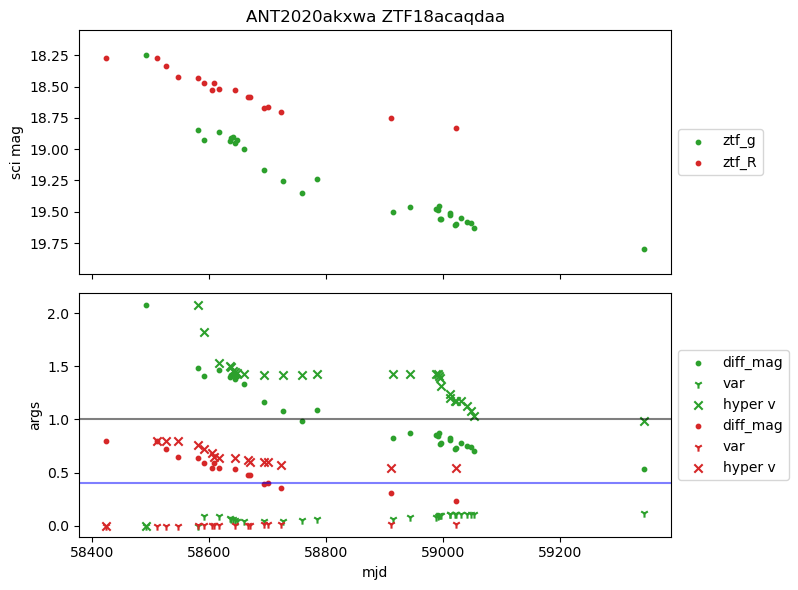

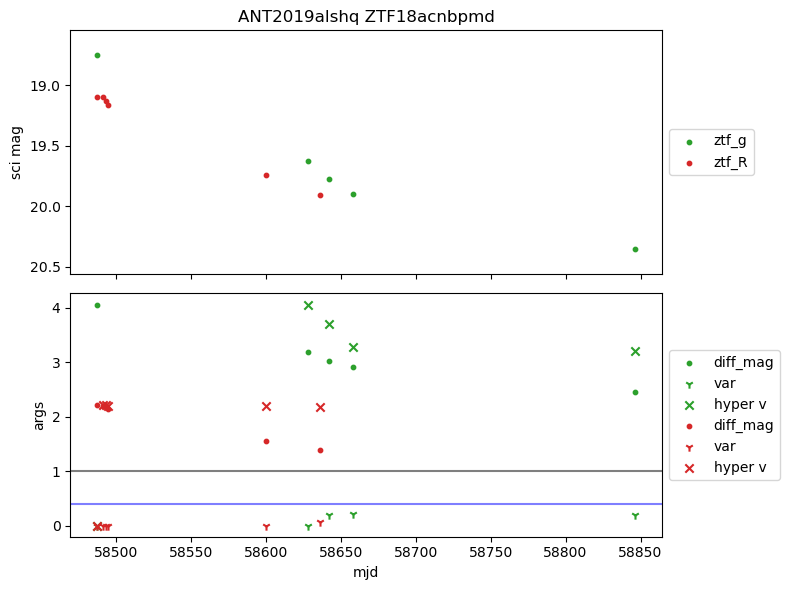

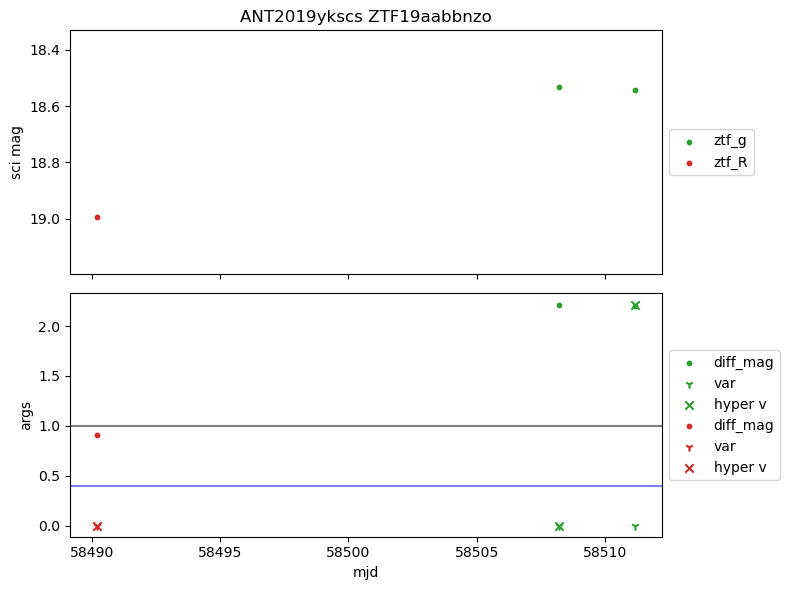

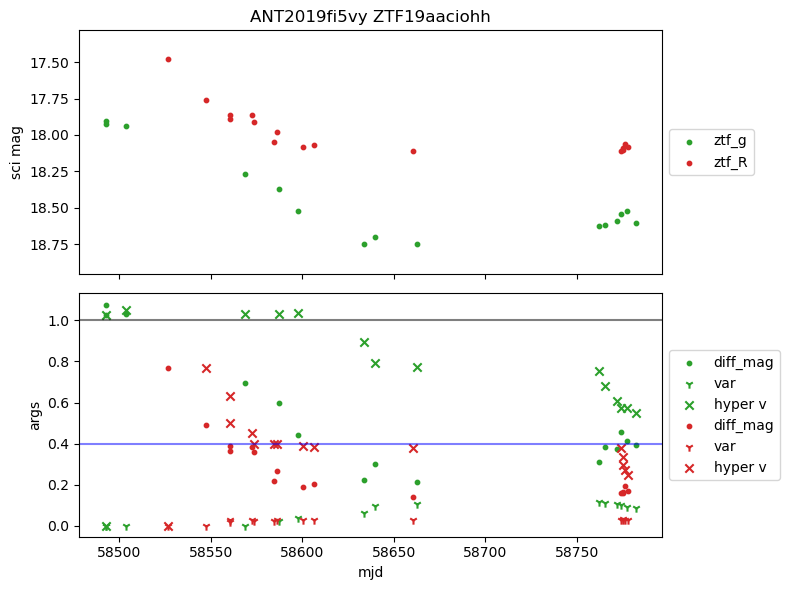

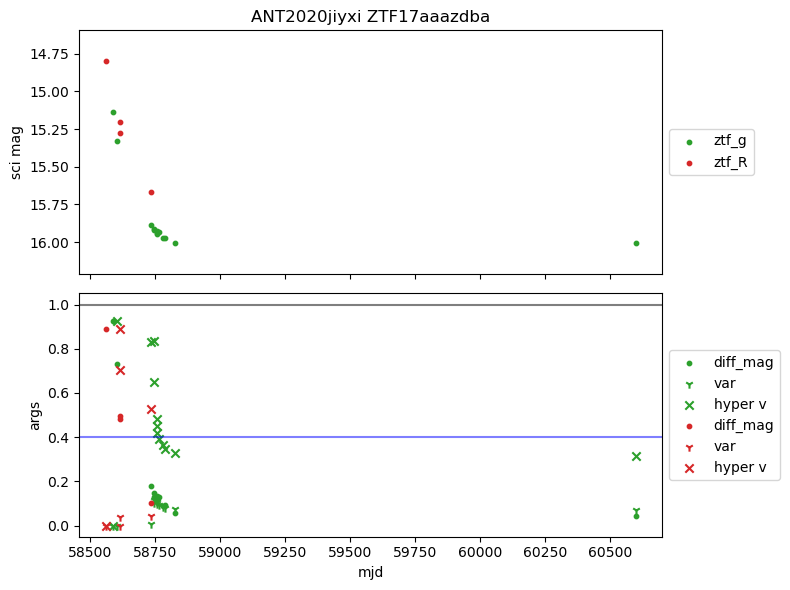

...

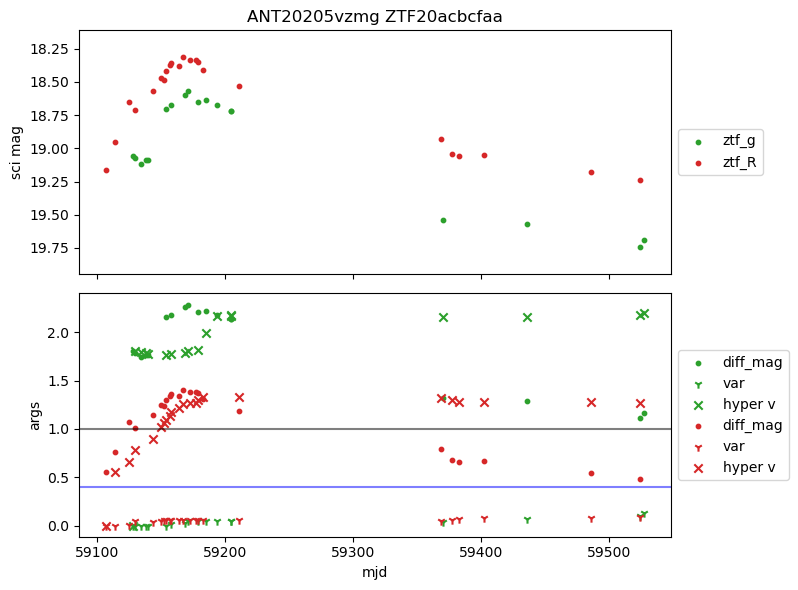

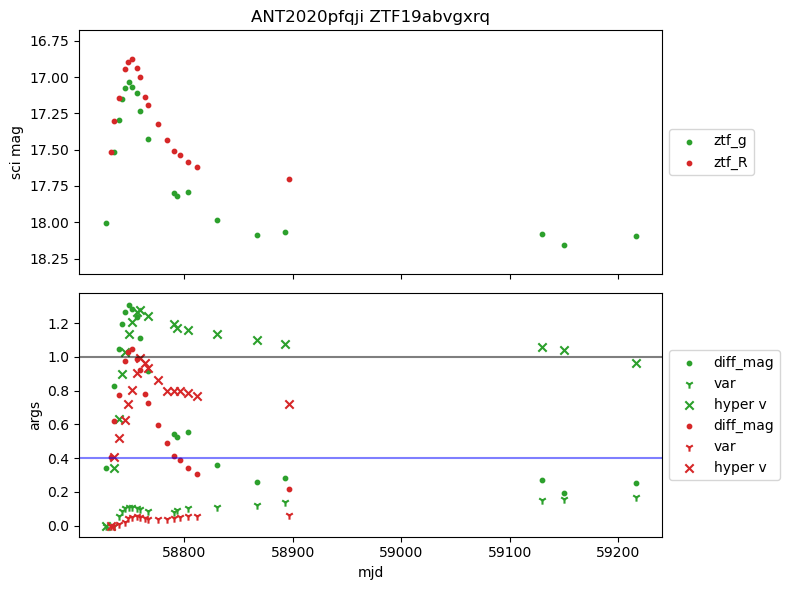

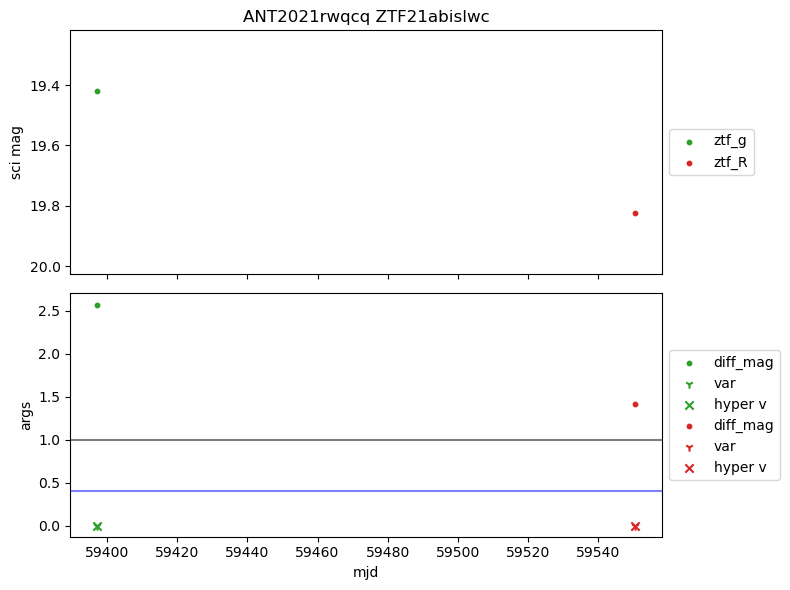

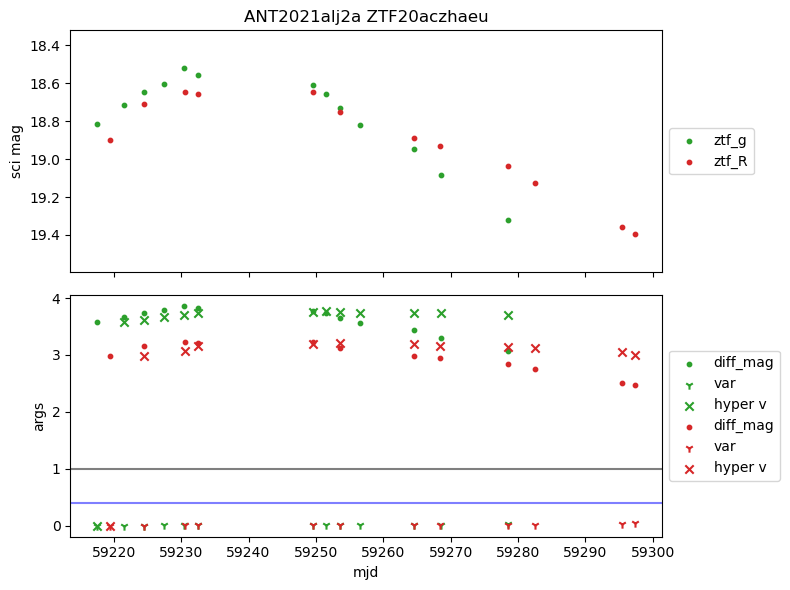

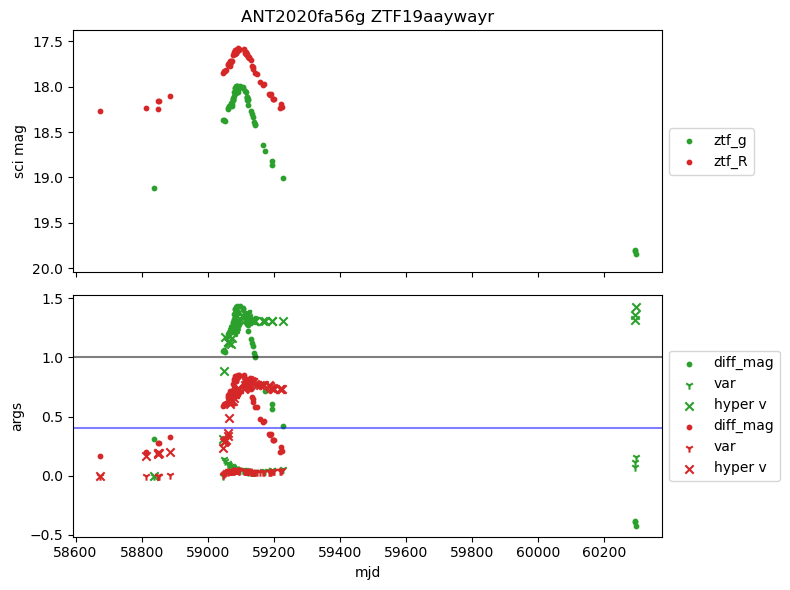

In [356]:
print('true and false positives from Yao et al 2023 paper')
colors = {'lsst_g': 'tab:blue', 'lsst_r': 'tab:orange', 'lsst_i': 'tab:brown', 'lsst_z': 'tab:pink', 'lsst_u': 'tab:olive', 
          'lsst_y': 'tab:cyan' ,'ztf_g': 'tab:green', 'ztf_R': 'tab:red', 'ztf_i': 'tab:purple'}
for key in windows:
    fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)
    max_mags = []
    min_mags = []
    for band in windows[key]:
        if isinstance(windows[key][band], pd.DataFrame) == 0:
            continue

        max_mags.append(max(windows[key][band]['oid_mag']))
        min_mags.append(min(windows[key][band]['oid_mag']))

        # ax[0].plot(windows[key][band]['mjd'], windows[key][band]['oid_mag'], label=band, color=colors[band])
        ax[0].scatter(windows[key][band]['mjd'], windows[key][band]['oid_mag'], s=10, label=band, color=colors[band])
        # ax[1].plot(windows[key][band]['mjd'], windows[key][band]['diff_mag'], color=colors[band])
        ax[1].scatter(windows[key][band]['mjd'], windows[key][band]['diff_mag'], s=10, label='diff_mag', color=colors[band])
        ax[1].scatter(windows[key][band]['mjd'], windows[key][band]['var'], marker='1', label='var', color=colors[band])
        ax[1].scatter(windows[key][band]['mjd'], windows[key][band]['hyper_v'], marker='x', label='hyper v', color=colors[band])
        
    ax[0].set_ylim([max(max_mags)+0.2, min(min_mags)-0.2])
    ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1].axhline(y=1, c='k', alpha=0.5)
    ax[1].axhline(y=0.4, c='b', alpha=0.5)
    
    ax[0].set_title(key)
    ax[0].set_ylabel('sci mag')
    ax[1].set_ylabel('args')
    ax[1].set_xlabel('mjd')
    plt.tight_layout()

In [353]:
# windows['ANT2020sswc2 ZTF19acfwynw']
windows['ANT2020nzw4s ZTF20abobpcb']

{'lsst_g': 0,
 'lsst_r': 0,
 'lsst_i': 0,
 'lsst_z': 0,
 'lsst_u': 0,
 'lsst_y': 0,
 'ztf_g':              mjd    oid_mag  diff_mag  med_diff       var   hyper_v    var_20
 0   59056.409387  19.562818  3.181181  0.000000  0.000000  0.000000  0.000000
 1   59059.311319  19.266386  3.477614  3.181181  0.000000  3.181181  0.000000
 2   59066.344479  18.883535  3.860465  3.329397  0.021968  3.330557  0.021968
 3   59068.218183  18.658255  4.085744  3.477614  0.077319  3.491339  0.077319
 4   59077.349421  18.196099  4.547900  3.669039  0.120918  3.700782  0.063016
 5   59080.391944  18.090794  4.653206  3.860465  0.225371  3.964323  0.081879
 6   59085.269132  17.884452  4.859548  3.973104  0.281797  4.129904  0.106153
 7   59089.335776  17.759526  4.984474  4.085744  0.338938  4.304808  0.016755
 8   59090.303623  17.742175  5.001824  4.316822  0.383086  4.580725  0.029171
 9   59091.257454  17.688617  5.055382  4.547900  0.403031  4.825178  0.032594
 10  59092.284491  17.688867  5.055133

consistent if there was a significant difference between overall variance and variance using data from within a given time frame (in this case, 20 days) then the overall variance was always more, so i think i need to see what the behavior is for a steady brightness object looks like to compare, im gonna use the general sample i have from earlier. but, i think ill probs use the overall variance value in the future rather than the day limited one

okay, so none of these pass the harshest variance threshold, which is hard cuz if i use a lower threshold then it will include a lot more than the hypervariables. using hyper v ($v = \sqrt{median(m_{diff})^2 + (4 var(m_{oid}))^2}$), they pass a 1 threshold, which i need to go back and check what values work for the sample from earlier.

also, if it passes a high threshold, it often only does so at/just after the peak, which isnt what we want ://

In [307]:
# sample_oids = {}
# for oid_locus in loci:
#     here_oid = oid_get_info(oid_locus.alerts)

#     sample_oids[oid_locus.id] = here_oid

sample_windows = {}
for key in oids_sample:
    window = moving_window_var(oids_sample[key], 20)
    sample_windows[key] = window

In [308]:
len(sample_windows)

8780

true and false positives from Yao et al 2023 paper


Text(0.5, 1.0, 'med diff')

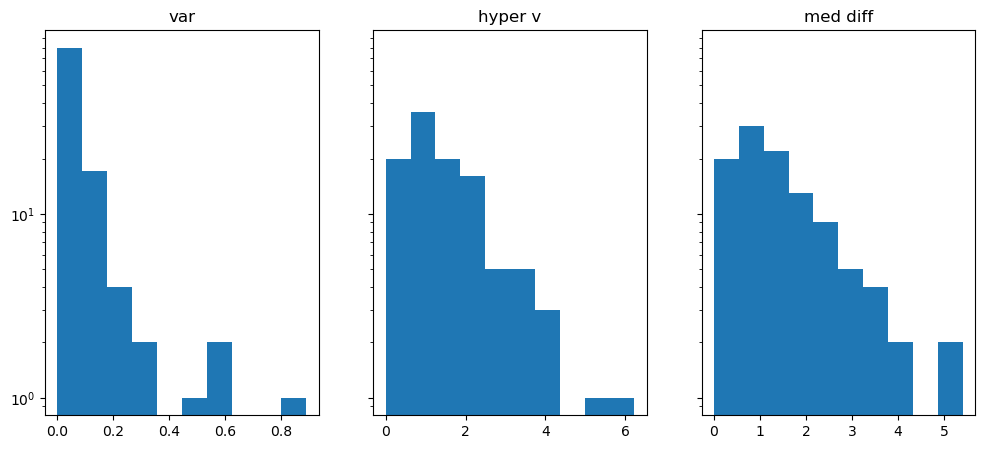

In [321]:
print('true and false positives from Yao et al 2023 paper')
tmax_var = []
tmax_hyper_v = []
tmax_med_diff = []
for oid in windows:
    for band in windows[oid]:
        if isinstance(windows[oid][band], pd.DataFrame):
            tmax_var.append(max(windows[oid][band]['var']))
            tmax_hyper_v.append(max(windows[oid][band]['hyper_v']))
            tmax_med_diff.append(max(windows[oid][band]['med_diff']))

            # if max(sample_windows[oid][band]['var']) >= 2.5:
            #     print(oid, band, 'var')
            # if max(sample_windows[oid][band]['hyper_v']) >= 10:
            #     print(oid, band, 'hyper v')
            # if max(sample_windows[oid][band]['med_diff']) >= 2:
            #     print(oid, band, 'med diff')
fig, ax = plt.subplots(1,3, figsize=(12,5), sharey=True)
ax[0].hist(tmax_var)
ax[1].hist(tmax_hyper_v)
ax[2].hist(tmax_med_diff)
ax[0].set_yscale('log')

ax[0].set_title('var')
ax[1].set_title('hyper v')
ax[2].set_title('med diff')

In [314]:
max_var = []
max_hyper_v = []
max_med_diff = []
for oid in sample_windows:
    for band in sample_windows[oid]:
        if isinstance(sample_windows[oid][band], pd.DataFrame):
            max_var.append(max(sample_windows[oid][band]['var']))
            max_hyper_v.append(max(sample_windows[oid][band]['hyper_v']))
            max_med_diff.append(max(sample_windows[oid][band]['med_diff']))

            # if max(sample_windows[oid][band]['var']) >= 2.5:
            #     print(oid, band, 'var')
            # if max(sample_windows[oid][band]['hyper_v']) >= 10:
            #     print(oid, band, 'hyper v')
            # if max(sample_windows[oid][band]['med_diff']) >= 2:
            #     print(oid, band, 'med diff')

Text(0.5, 1.0, 'med diff')

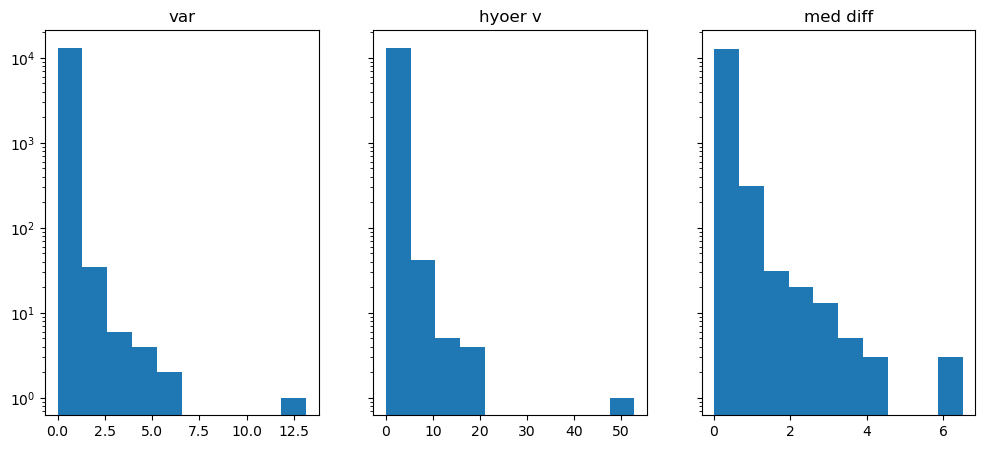

In [322]:
fig, ax = plt.subplots(1,3, figsize=(12,5), sharey=True)
ax[0].hist(max_var)
ax[1].hist(max_hyper_v)
ax[2].hist(max_med_diff)
ax[0].set_yscale('log')

ax[0].set_title('var')
ax[1].set_title('hyoer v')
ax[2].set_title('med diff')

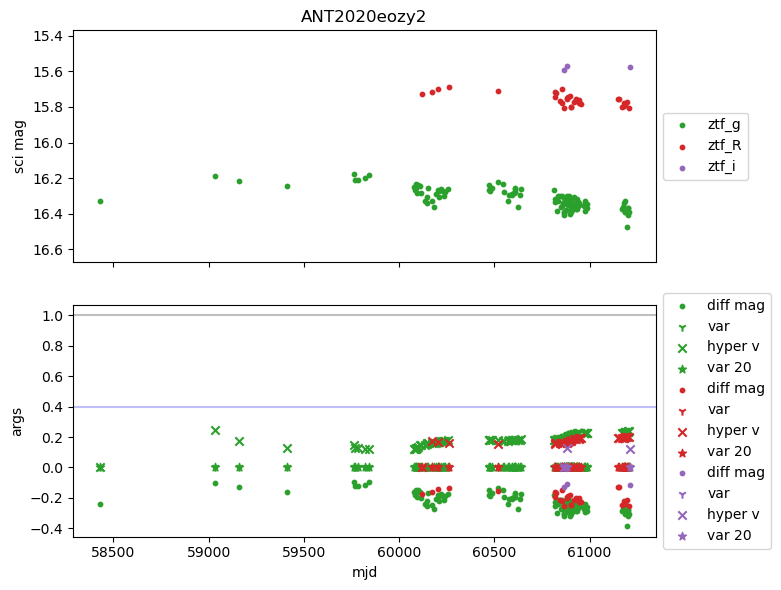

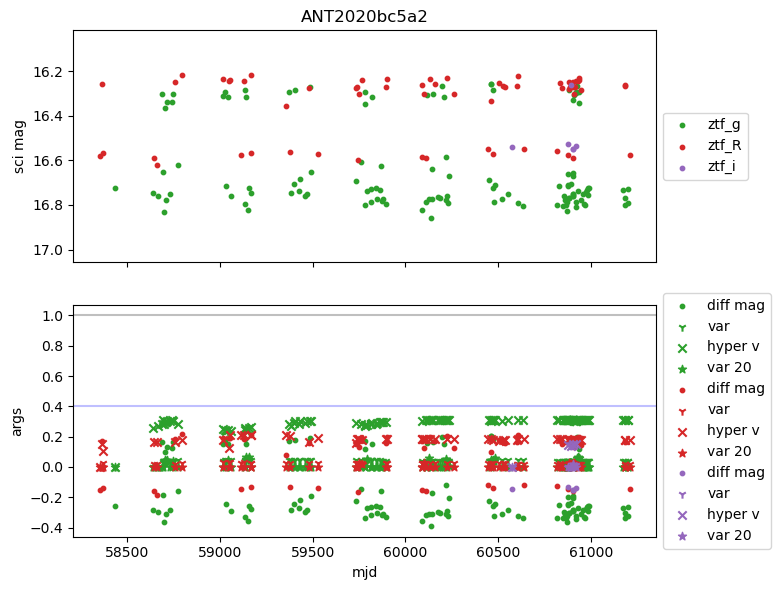

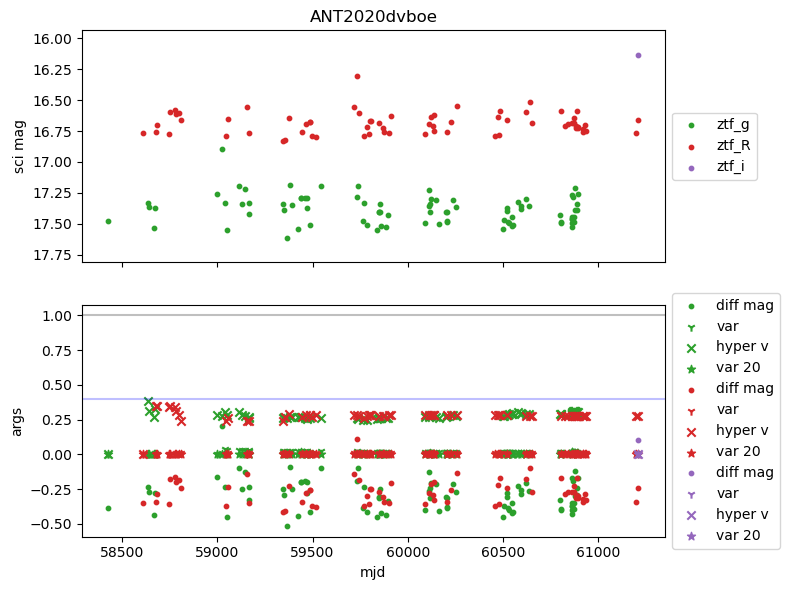

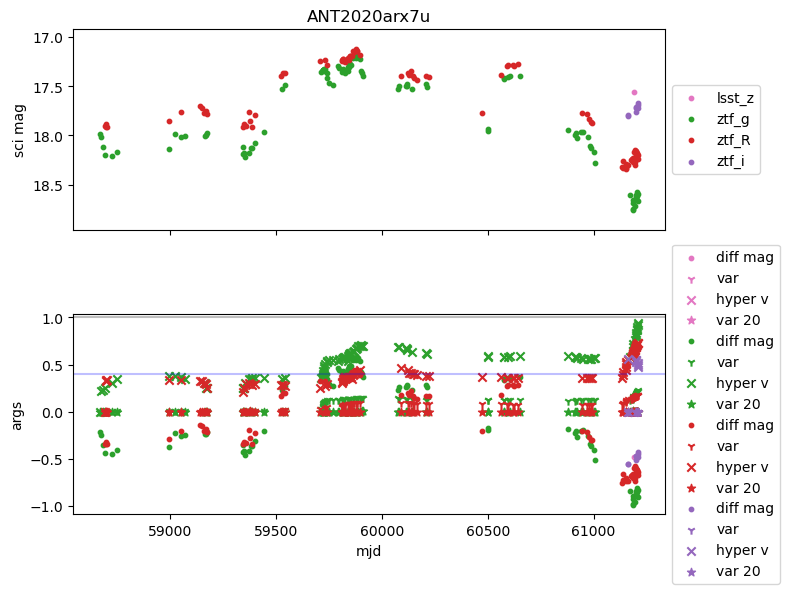

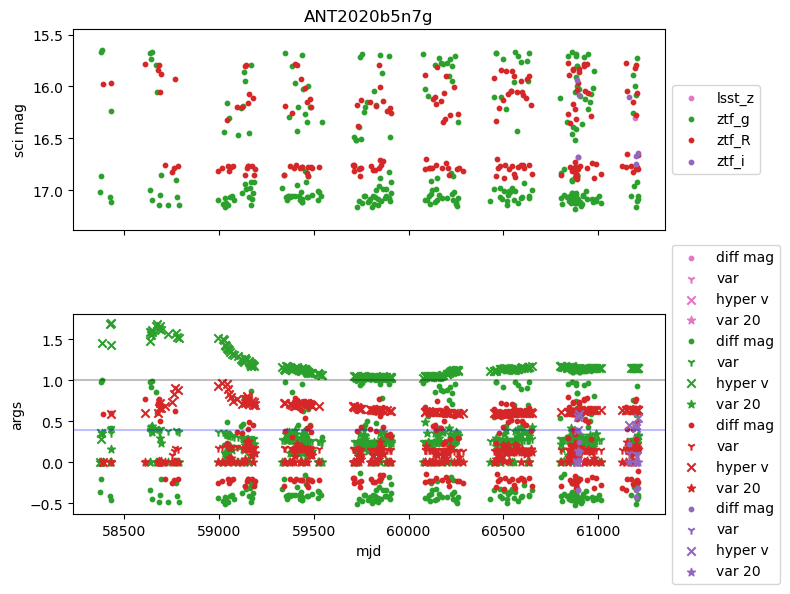

...

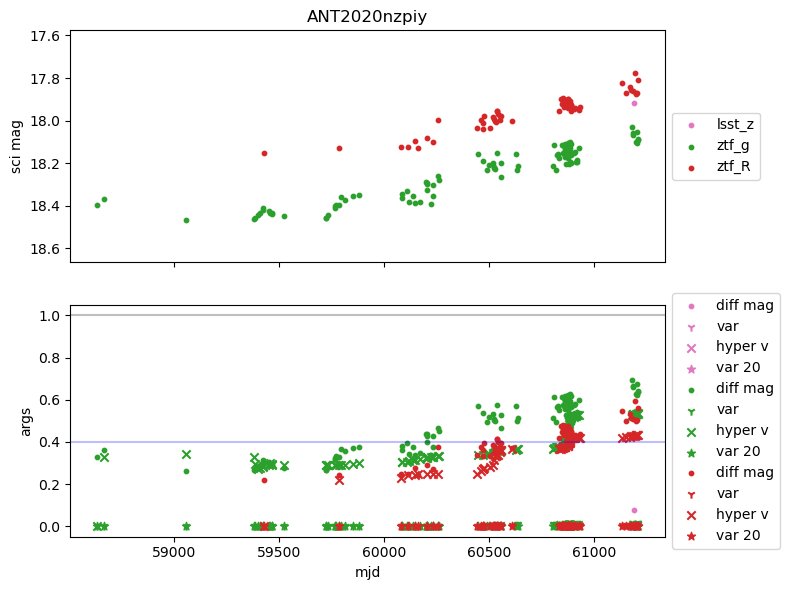

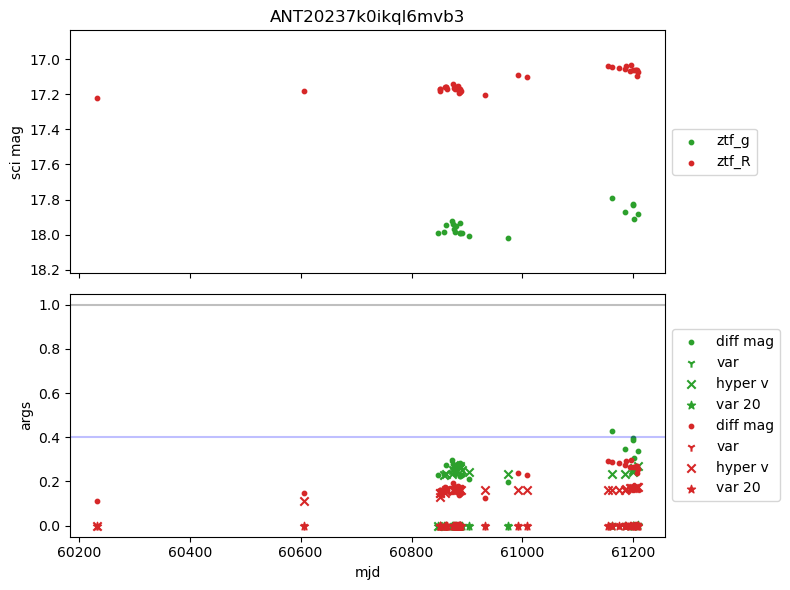

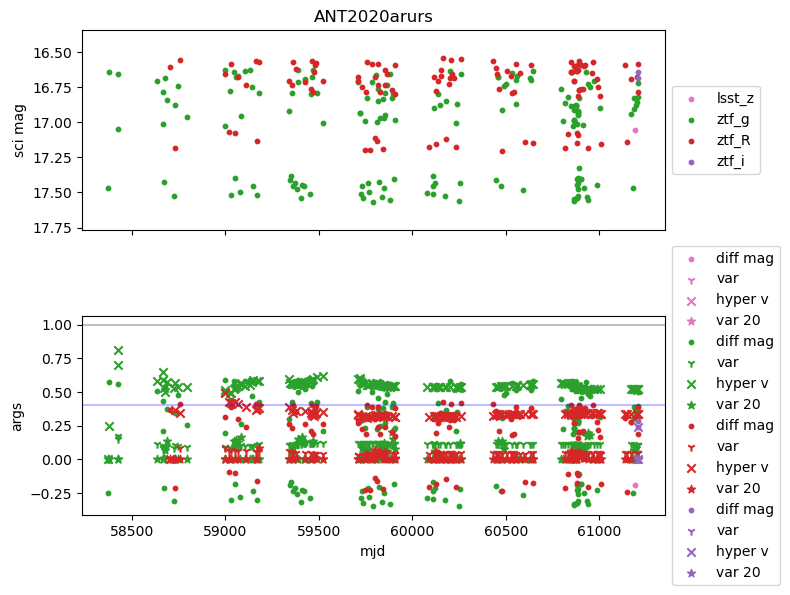

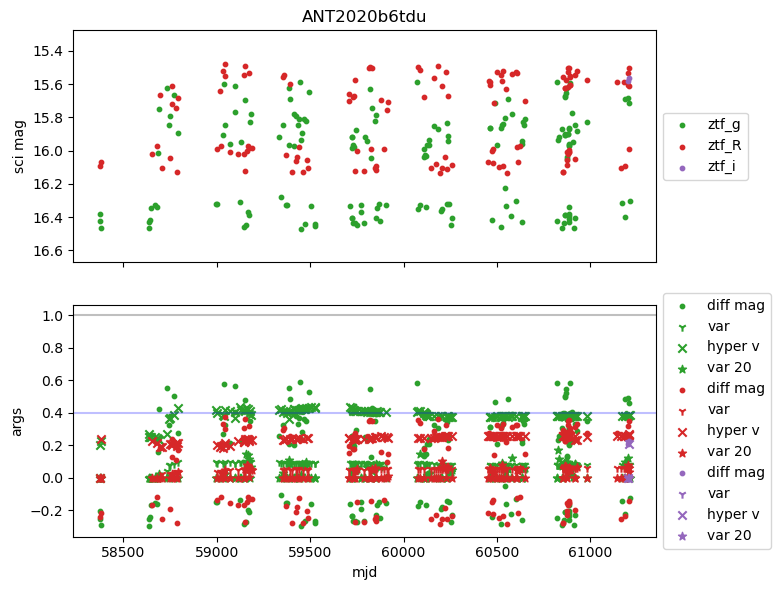

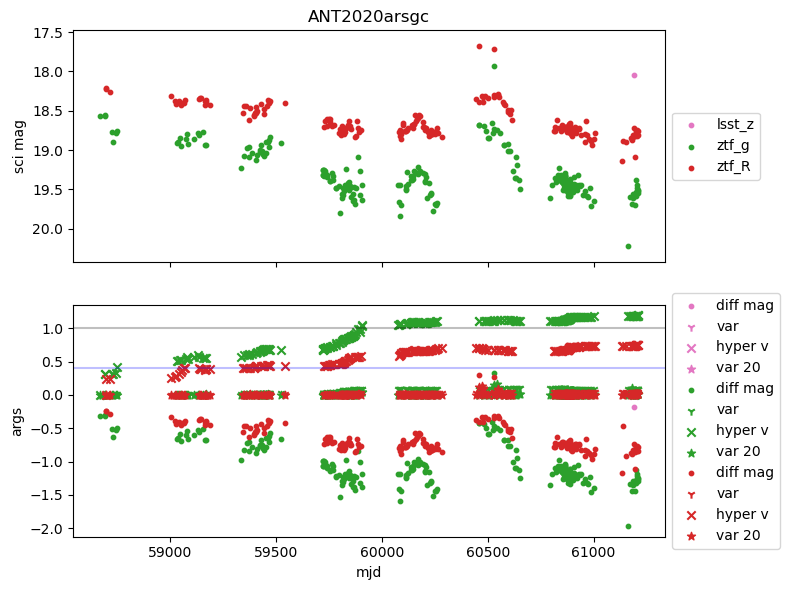

In [280]:
colors = {'lsst_g': 'tab:blue', 'lsst_r': 'tab:orange', 'lsst_i': 'tab:brown', 'lsst_z': 'tab:pink', 'lsst_u': 'tab:olive', 
          'lsst_y': 'tab:cyan' ,'ztf_g': 'tab:green', 'ztf_R': 'tab:red', 'ztf_i': 'tab:purple'}
i = 10
for key in sample_windows:
    fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)
    max_mags = []
    min_mags = []
    for band in sample_windows[key]:
        if isinstance(sample_windows[key][band], pd.DataFrame) == 0:
            continue

        max_mags.append(max(sample_windows[key][band]['oid_mag']))
        min_mags.append(min(sample_windows[key][band]['oid_mag']))

        # ax[0].plot(sample_windows[key][band]['mjd'], sample_windows[key][band]['oid_mag'], label=band, color=colors[band])
        ax[0].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['oid_mag'], label=band, s=10, color=colors[band])
        # ax[1].plot(sample_windows[key][band]['mjd'], sample_windows[key][band]['diff_mag'], color=colors[band])
        ax[1].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['diff_mag'], s=10, label='diff mag', color=colors[band])
        ax[1].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['var'], marker='1', label='var', color=colors[band])
        ax[1].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['hyper_v'], marker='x', label='hyper v', color=colors[band])
        # ax[1].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['var_20'], marker='*', label='var 20', color=colors[band])
        
    ax[0].set_ylim([max(max_mags)+0.2, min(min_mags)-0.2])
    ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1].axhline(y=1, c='k', alpha=0.25)
    ax[1].axhline(y=0.4, c='b', alpha=0.25)
    
    ax[0].set_title(key)
    ax[0].set_ylabel('sci mag')
    ax[1].set_ylabel('args')
    ax[1].set_xlabel('mjd')
    plt.tight_layout()

    i+= 1
    if i > 20:
        break

just looking thru this sample, i dont feel like the parameters we're using are sufficient enough to use as a filter. the tdes i have from the paper jessie suggested underperform and even in just the first 10 of the random sample, there are lightcurve behaviors i want to pass that fail and vice versa. ugh

In [329]:
def perc(oids, threshes, variable):
    perc = []
    for thres in threshes:
        count = 0
        for oid in oids:
            check = 0
            for band in oids[oid]:
                if isinstance(oids[oid][band], pd.DataFrame) == 0:
                    continue
                if np.any(oids[oid][band][variable] >= thres):
                    check += 1
            if check > 0:
                count += 1
        perc.append(float(100*count/len(oids)))
    return perc

# fig, ax = plt.subplots(1,2)
threshes = {'var': np.arange(0, 5, 0.05), 'diff_mag': np.arange(0, 5, 0.05), 'hyper_v': np.arange(0, 5, 0.05)}
sample_perc = {}
for thing in threshes:
    sample_perc[thing] = perc(sample_windows, threshes[thing], thing)
# for thing in threshes:
#     ax[0].plot(threshes[thing], perc(sample_windows, threshes[thing], thing), label=thing)
    # ax[1].plot(threshes[thing], perc(windows, threshes[thing], thing), label=thing)
# plt.ylim(0, 4)
# plt.xlabel('threshold')
# plt.ylabel('percentage that pass threshold')
# plt.title('pass/fails on 8k sample')
# plt.grid(alpha=0.25)
# plt.legend()
# plt.tight_layout()

In [330]:
tperc = {}
for thing in threshes:
    tperc[thing] = perc(windows, threshes[thing], thing)

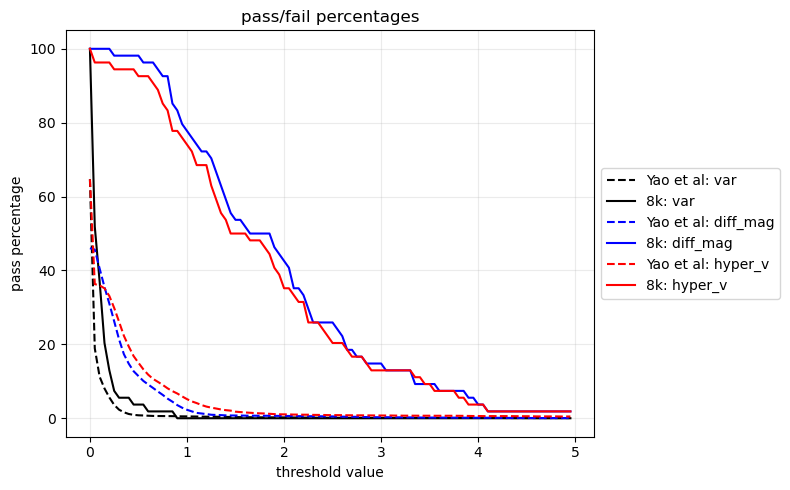

In [354]:
color_thing = {'var':'k', 'diff_mag':'b', 'hyper_v':'r'}
plt.figure(figsize=(8,5))
for thing in sample_perc:
    plt.plot(threshes[thing], sample_perc[thing], '--', c=color_thing[thing], label='Yao et al: '+thing)
    plt.plot(threshes[thing], tperc[thing],  c=color_thing[thing], label='8k: '+thing)

plt.title('pass/fail percentages')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('pass percentage')
plt.xlabel('threshold value')
# plt.ylim(0,10)
plt.grid(alpha=0.25)
plt.tight_layout()

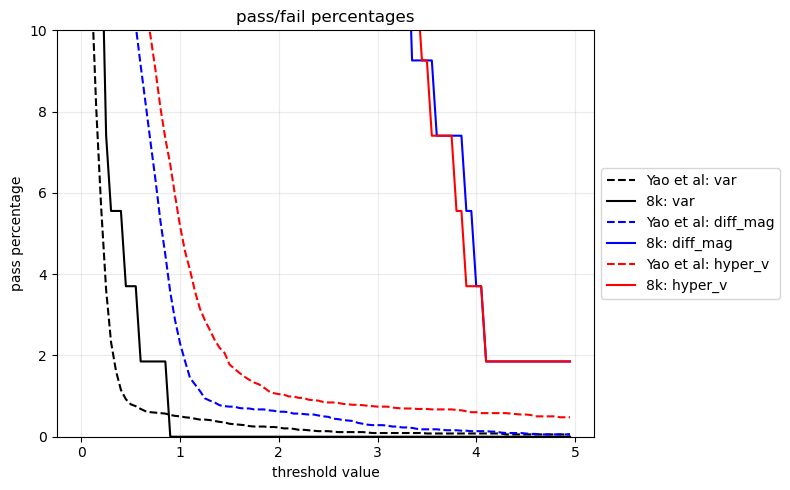

In [355]:
color_thing = {'var':'k', 'diff_mag':'b', 'hyper_v':'r'}
plt.figure(figsize=(8,5))
for thing in sample_perc:
    plt.plot(threshes[thing], sample_perc[thing], '--', c=color_thing[thing], label='Yao et al: '+thing)
    plt.plot(threshes[thing], tperc[thing],  c=color_thing[thing], label='8k: '+thing)

plt.title('pass/fail percentages')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('pass percentage')
plt.xlabel('threshold value')
plt.ylim(0,10)
plt.grid(alpha=0.25)
plt.tight_layout()

from this, its clear that the sample from Yao et al does do better than the 8k random sample, but this doesnt say anything about WHEN the oids passed the filter. i want smth to measure how many days from the max peak the trigger happened, and whether the trigger was before or after the max peak. i really want for the oids to not only pass, but that they pass prior to peak.

of the 

In [ ]:
colors = {'lsst_g': 'tab:blue', 'lsst_r': 'tab:orange', 'lsst_i': 'tab:brown', 'lsst_z': 'tab:pink', 'lsst_u': 'tab:olive', 
          'lsst_y': 'tab:cyan' ,'ztf_g': 'tab:green', 'ztf_R': 'tab:red', 'ztf_i': 'tab:purple'}
i = 10
for key in sample_windows:
    fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)
    max_mags = []
    min_mags = []
    for band in sample_windows[key]:
        if isinstance(sample_windows[key][band], pd.DataFrame) == 0:
            continue

        max_mags.append(max(sample_windows[key][band]['oid_mag']))
        min_mags.append(min(sample_windows[key][band]['oid_mag']))

        if max(sample_windows[key][band]['hyper_v']) <
        # ax[0].plot(sample_windows[key][band]['mjd'], sample_windows[key][band]['oid_mag'], label=band, color=colors[band])
        ax[0].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['oid_mag'], label=band, s=10, color=colors[band])
        # ax[1].plot(sample_windows[key][band]['mjd'], sample_windows[key][band]['diff_mag'], color=colors[band])
        ax[1].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['diff_mag'], s=10, label='diff mag', color=colors[band])
        ax[1].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['var'], marker='1', label='var', color=colors[band])
        ax[1].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['hyper_v'], marker='x', label='hyper v', color=colors[band])
        # ax[1].scatter(sample_windows[key][band]['mjd'], sample_windows[key][band]['var_20'], marker='*', label='var 20', color=colors[band])
        
    ax[0].set_ylim([max(max_mags)+0.2, min(min_mags)-0.2])
    ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1].axhline(y=1, c='k', alpha=0.25)
    ax[1].axhline(y=0.4, c='b', alpha=0.25)
    
    ax[0].set_title(key)
    ax[0].set_ylabel('sci mag')
    ax[1].set_ylabel('args')
    ax[1].set_xlabel('mjd')
    plt.tight_layout()

    i+= 1
    if i > 20:
        break

# 6/30
continuing the work from last week, but im using the same data so ill use the same notebook

plotting a vertical line on the mjd where the lightcurve would pass the trigger. also testing out new constants to use in hyper v since using a constant of 4 causes it to behave the same as diff mag

true and false positives from Yao et al 2023 paper


/var/folders/ym/gbj1z46s0wg5zdmkkq0xpptr0000gs/T/ipykernel_6520/2623432612.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)


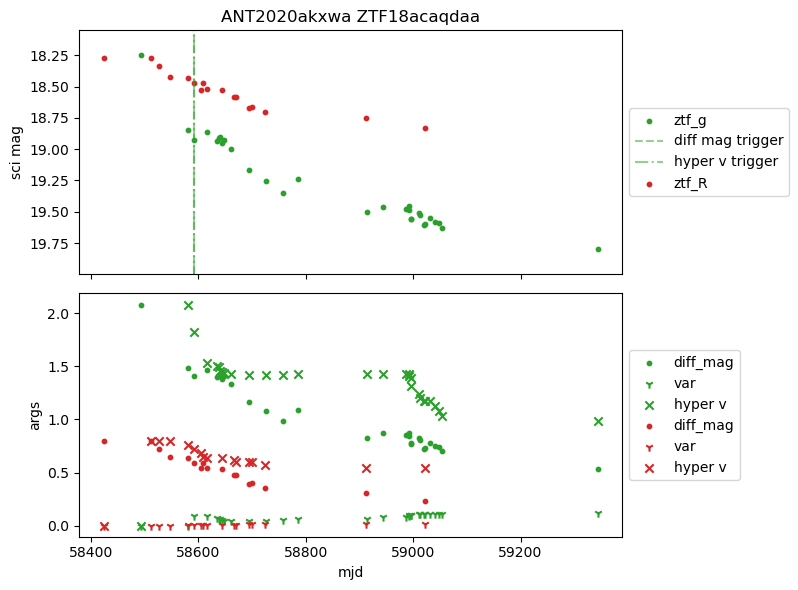

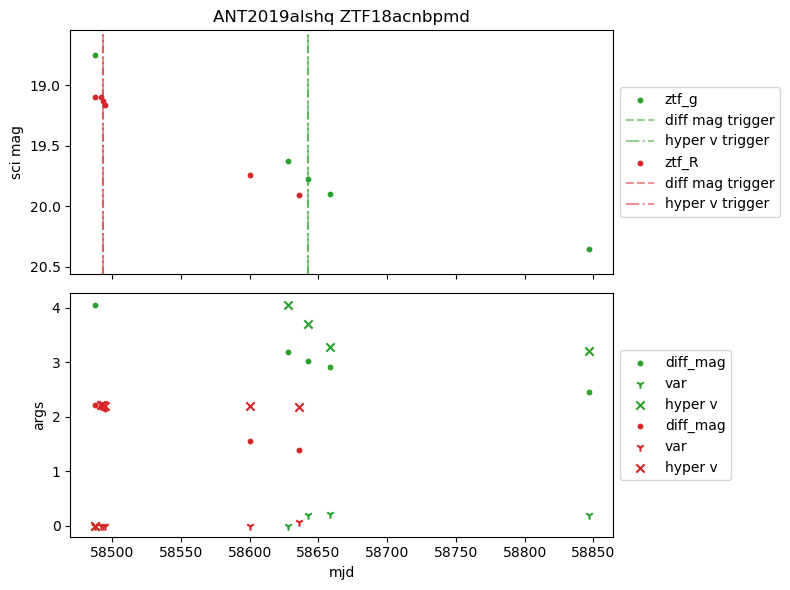

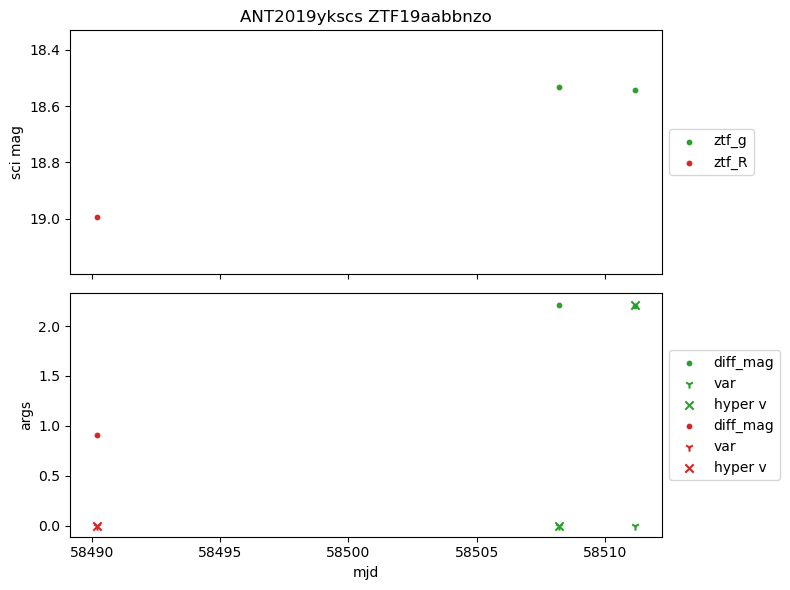

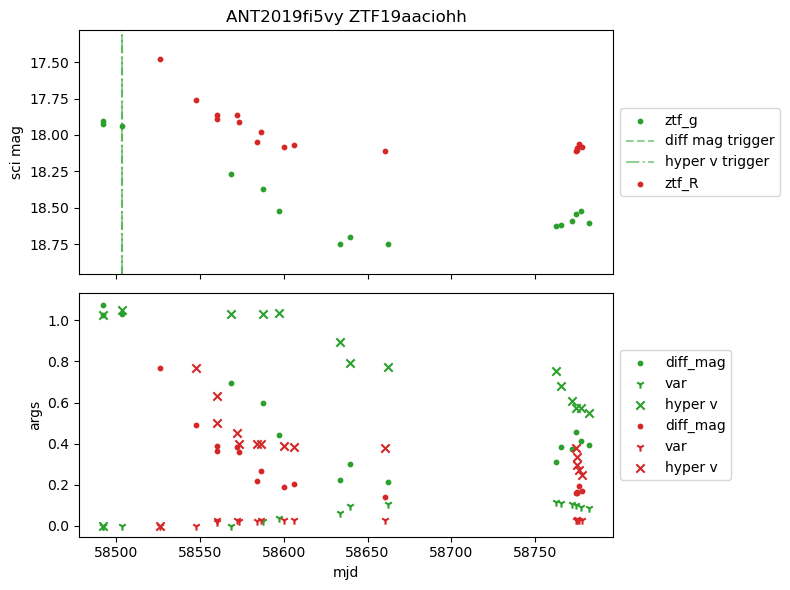

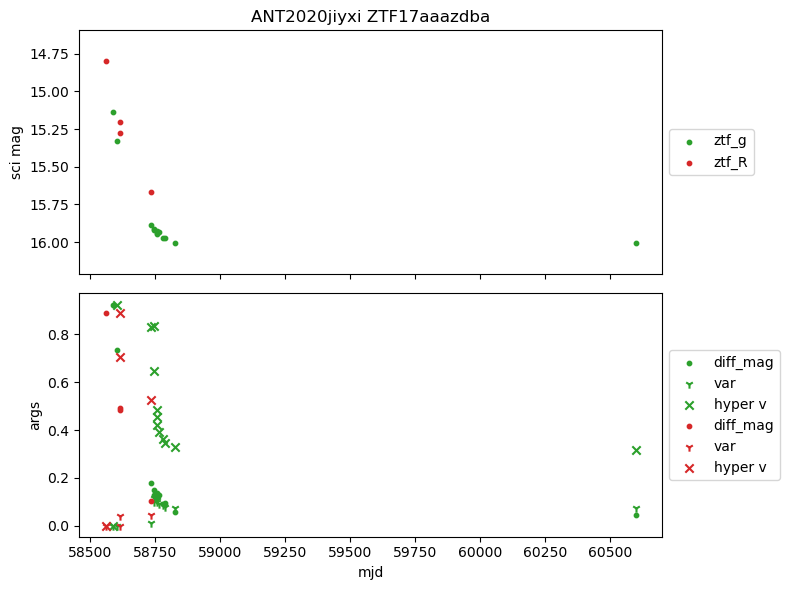

...

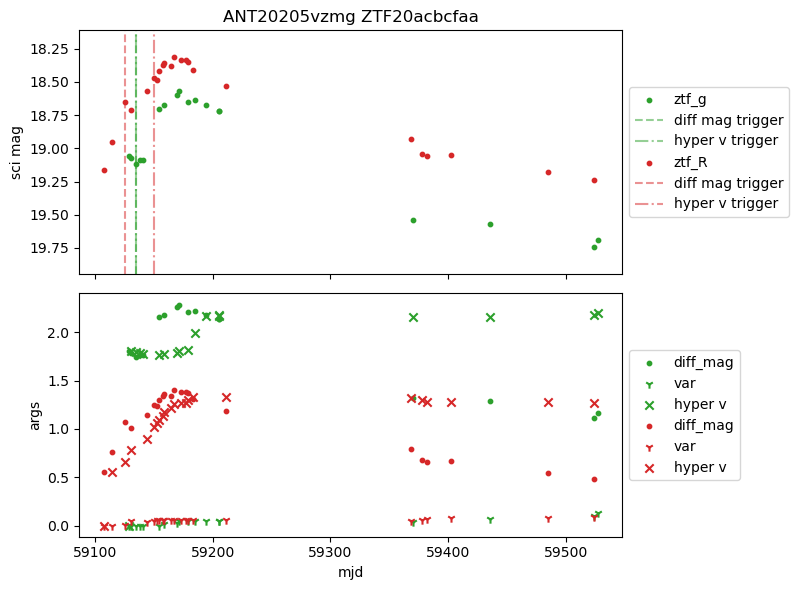

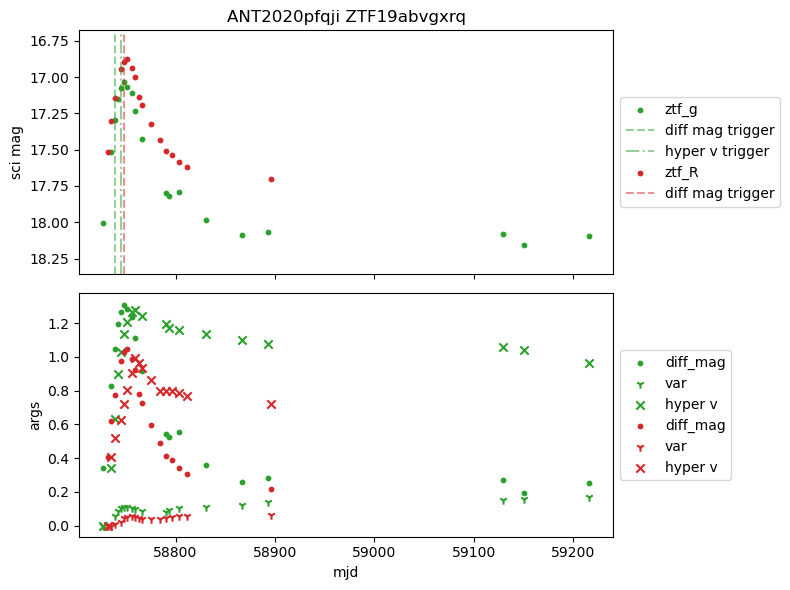

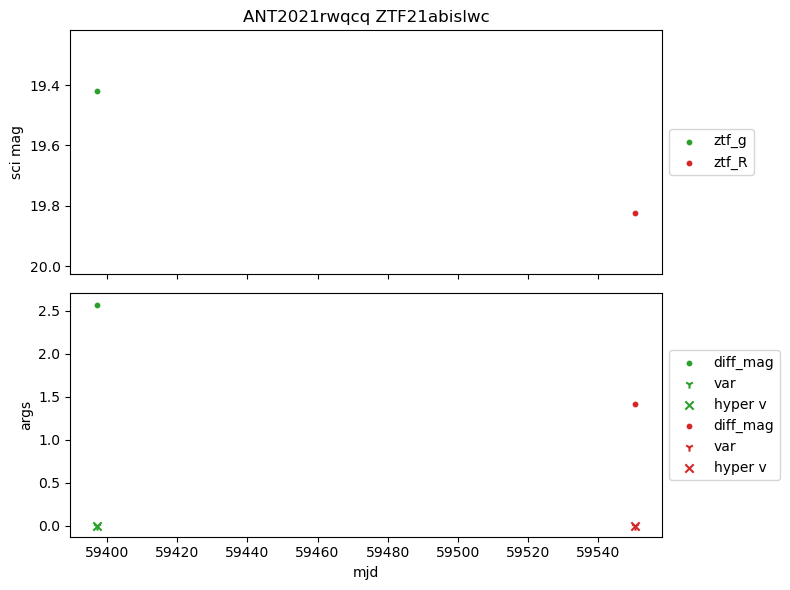

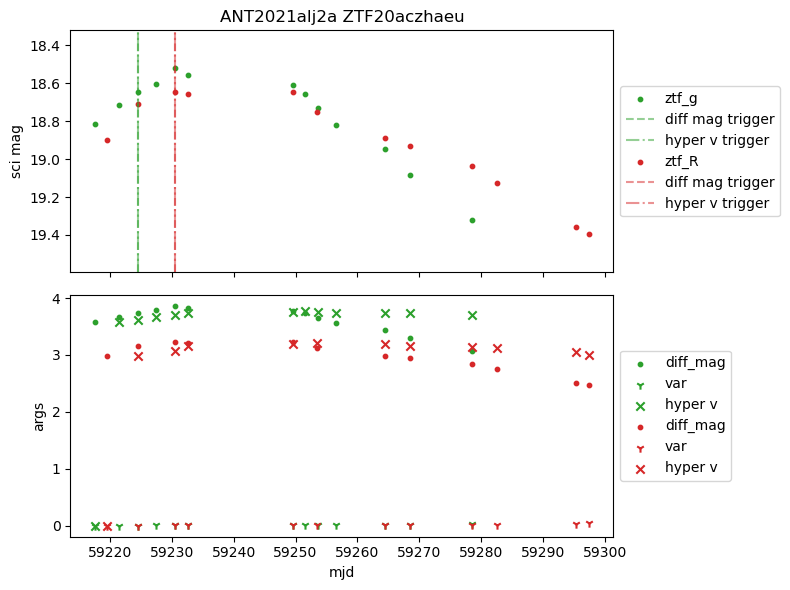

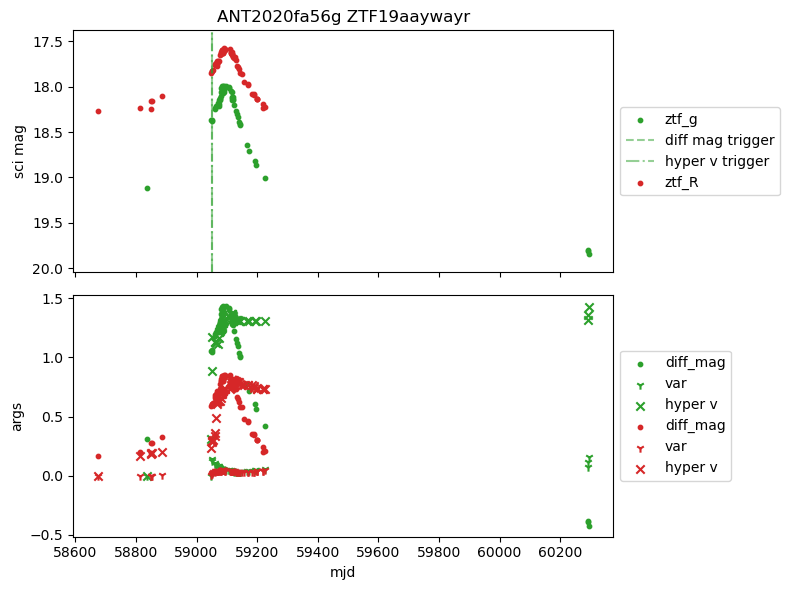

In [400]:
print('true and false positives from Yao et al 2023 paper')
colors = {'lsst_g': 'tab:blue', 'lsst_r': 'tab:orange', 'lsst_i': 'tab:brown', 'lsst_z': 'tab:pink', 'lsst_u': 'tab:olive', 
          'lsst_y': 'tab:cyan' ,'ztf_g': 'tab:green', 'ztf_R': 'tab:red', 'ztf_i': 'tab:purple'}
for key in windows:
    fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)
    max_mags = []
    min_mags = []
    for band in windows[key]:
        if isinstance(windows[key][band], pd.DataFrame) == 0:
            continue

        max_mags.append(max(windows[key][band]['oid_mag']))
        min_mags.append(min(windows[key][band]['oid_mag']))

        ax[0].scatter(windows[key][band]['mjd'], windows[key][band]['oid_mag'], s=10, label=band, color=colors[band])
        ax[1].scatter(windows[key][band]['mjd'], windows[key][band]['diff_mag'], s=10, label='diff_mag', color=colors[band])
        ax[1].scatter(windows[key][band]['mjd'], windows[key][band]['var'], marker='1', label='var', color=colors[band])
        ax[1].scatter(windows[key][band]['mjd'], windows[key][band]['hyper_v'], marker='x', label='hyper v', color=colors[band])

        # trig_dm_i = list(x > 1 for x in windows[key][band]['diff_mag'][2:]).index(True)
        trig_diff_mag = windows[key][band]['diff_mag'][2:] > 1
        if trig_diff_mag.sum() > 0:
            trig_dmi = list(trig_diff_mag).index(True) + 2
            ax[0].axvline(windows[key][band]['mjd'][trig_dmi], 0, 2.5, ls='--', c=colors[band], label='diff mag trigger', alpha=0.5)
        
        trig_var = windows[key][band]['var'][2:] > 0.4
        if trig_var.sum() > 0:
            trig_vari = list(trig_var).index(True) + 2
            ax[0].axvline(windows[key][band]['mjd'][trig_vari], 0, 2.5, ls=':', c=colors[band], label='var trigger', alpha=0.5)
            
        trig_hyperv = windows[key][band]['hyper_v'][2:] > 1
        if trig_hyperv.sum() > 0:
            trig_hypervi = list(trig_hyperv).index(True) + 2
            ax[0].axvline(windows[key][band]['mjd'][trig_hypervi], 0, 2.5, ls='-.', c=colors[band], label='hyper v trigger', alpha=0.5)
        
    ax[0].set_ylim([max(max_mags)+0.2, min(min_mags)-0.2])
    ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # ax[1].axhline(y=1, c='k', alpha=0.5)
    # ax[1].axhline(y=0.4, c='b', alpha=0.5)
    
    ax[0].set_title(key)
    ax[0].set_ylabel('sci mag')
    ax[1].set_ylabel('args')
    ax[1].set_xlabel('mjd')
    plt.tight_layout()

In [394]:
trig_diff_mag.iloc[0]

np.False_

In [413]:
rat = []
for key in sample_windows:
    for band in sample_windows[key]:
        if isinstance(sample_windows[key][band], pd.DataFrame) == 0:
            continue
    
        rat_here = np.median(abs(sample_windows[key][band]['var']/sample_windows[key][band]['diff_mag']))
        rat.append(float(rat_here))

r1 = [x for x in rat if str(x) != 'nan']
r2 = [x for x in r1 if x != 0.0]
print(1/np.mean(r2), 1/np.median(r2))
r2

7.059080847244611 10.67779863493155


[0.2702297418093923,
 0.22292436667578333,
 0.0027471229860265714,
 0.2742426393051234,
 0.32796104575780743,
 3.0636688750646545e-05,
 0.37441694669578207,
 0.2627145730497121,
 0.02583811521432617,
 0.013367882615430142,
 0.011539217346705257,
 0.004575237334462476,
 0.23728917199652133,
 0.16342743233899404,
 0.04265001921190949,
 0.09740350217244813,
 0.2591181040862117,
 0.24478039416104252,
 0.015617795880688155,
 0.012507747810159847,
 0.0010312668533550358,
 0.007147416796730795,
 0.010556534586490866,
 0.01671984075957049,
 0.01635936557852413,
 0.003456079838278957,
 0.0035322605910752735,
 0.00817030857859518,
 0.0015242581451490255,
 0.7773860725320632,
 0.6535175373214707,
 0.20457700679984914,
 0.08169538145386551,
 0.21825823972093128,
 0.001851211378713394,
 0.4160273552782599,
 0.406271668390677,
 0.6223892104795645,
 0.2860576728889678,
 0.26925501973180477,
 0.22436838041831822,
 0.00294561433015839,
 0.0003210049017089488,
 0.003785004922727554,
 0.00371813478249498

In [414]:
rat = []
for key in windows:
    for band in windows[key]:
        if isinstance(windows[key][band], pd.DataFrame) == 0:
            continue
    
        rat_here = np.median(abs(windows[key][band]['var']/windows[key][band]['diff_mag']))
        rat.append(float(rat_here))

r1 = [x for x in rat if str(x) != 'nan']
r2 = [x for x in r1 if x != 0.0]
print(1/np.mean(r2), 1/np.median(r2))
r2

26.410313476746815 55.967857521557306


[0.08351589507480944,
 0.014853770053250401,
 0.06389986361819062,
 7.581175068325957e-05,
 0.21987119389153037,
 0.11886872355895765,
 0.8341779054552498,
 0.04180602537360492,
 0.0028159146746268866,
 0.002922296072497173,
 0.001220823233325664,
 0.029871495460821074,
 0.011658961653294237,
 0.004763050045597595,
 0.018066884536622956,
 0.004924340528399564,
 0.12046851797364867,
 0.1506150869175319,
 0.008851537328403485,
 0.030439251625832324,
 0.02419759231782595,
 0.010119657224064221,
 0.046182086359950233,
 0.03499614049711756,
 0.013491788329705757,
 0.03867583406382991,
 0.005579004097200612,
 0.11667370116578436,
 0.10810403444785194,
 0.02233036334977395,
 0.02495485236270544,
 0.024270954568080573,
 0.042393792232896244,
 0.0062948541638241425,
 0.0027818132916589047,
 0.0027899310233792897,
 0.006146227766230048,
 0.002523210440243378,
 0.06278753168039887,
 0.025207874499086305,
 0.03351976668763723,
 0.0043621384592475825,
 0.010838791059752446,
 0.02013112163230628,
 0

In [419]:

def moving_window_hvc(oid, day_lim, hv_const):
    passes = {'lsst_g': 0, 'lsst_r': 0, 'lsst_i': 0, 'lsst_z': 0, 'lsst_u': 0, 'lsst_y': 0, 
               'ztf_g': 0, 'ztf_R': 0, 'ztf_i': 0}
    for band in oid:
        if oid[band] == 0:
            continue
            
        here_data = []
        for i in np.arange(0, len(oid[band]['data']), 1):
            mjd = float(oid[band]['data']['mjd'][i])
            oid_mag = float(oid[band]['data']['oid_mag'][i])
            diff_mag = float(oid[band]['data']['template_mag'][i]-oid[band]['data']['oid_mag'][i])
            
            if i == 0:
                here_data = [[mjd, oid_mag, diff_mag, 0, 0, 0, 0]]
            else:
                night = float(mjd - oid[band]['data']['mjd'][0])
                med_diff = float(np.median(oid[band]['data']['template_mag'][:i]-oid[band]['data']['oid_mag'][:i]))
                var = float(np.var(oid[band]['data']['oid_mag'][:i]))
                hyper_v = float(np.sqrt(med_diff**2 + (hv_const*var)**2))
                j = 1
                day_lim_var = 0
                while day_lim > (oid[band]['data']['mjd'][i] - oid[band]['data']['mjd'][i-j]):
                    day_lim_var = float(np.var(oid[band]['data']['oid_mag'][i-j:i]))
                    if j < i:
                        j += 1
                    else:
                        break
                
                here_data.append([mjd, oid_mag, diff_mag, med_diff, var, hyper_v, day_lim_var])
        here_df = pd.DataFrame(np.array(here_data), columns = ['mjd', 'oid_mag', 'diff_mag', 'med_diff', 'var', 'hyper_v', 'var_20'])
        passes[band] = here_df

    return passes

In [420]:
windows_8k_hvc7 = {}
for key in t_oids:
    window = moving_window_hvc(t_oids[key], 20, 7)
    windows_8k_hvc7[key] = window

windows_8k_hvc10 = {}
for key in t_oids:
    window = moving_window_hvc(t_oids[key], 20, 10)
    windows_8k_hvc10[key] = window


true and false positives from Yao et al 2023 paper


/var/folders/ym/gbj1z46s0wg5zdmkkq0xpptr0000gs/T/ipykernel_6520/3129853843.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)


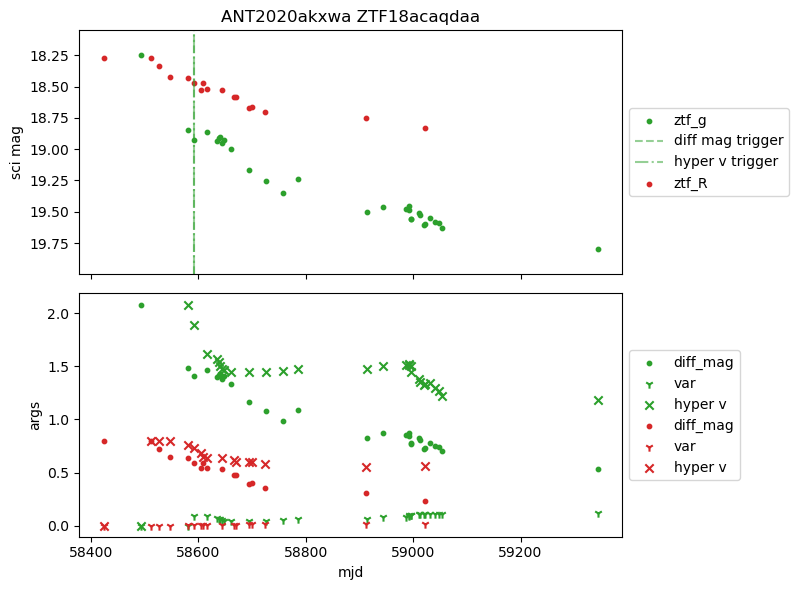

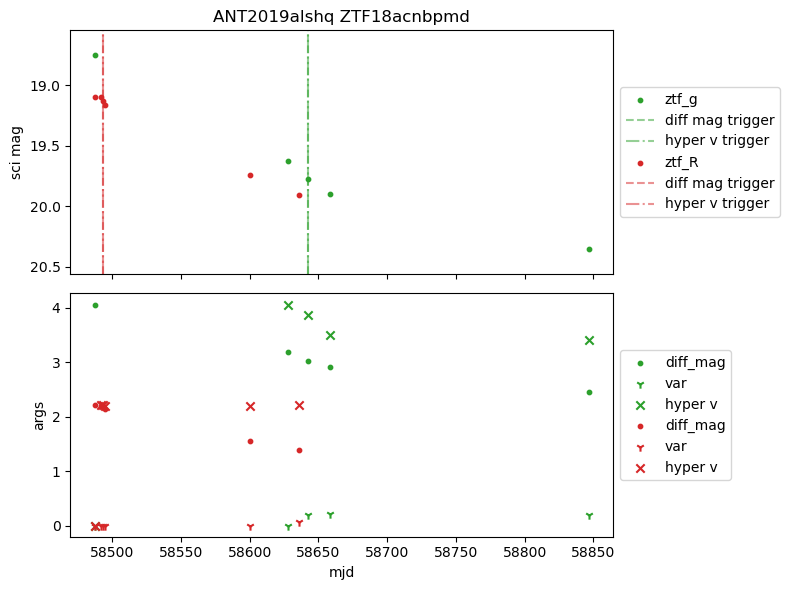

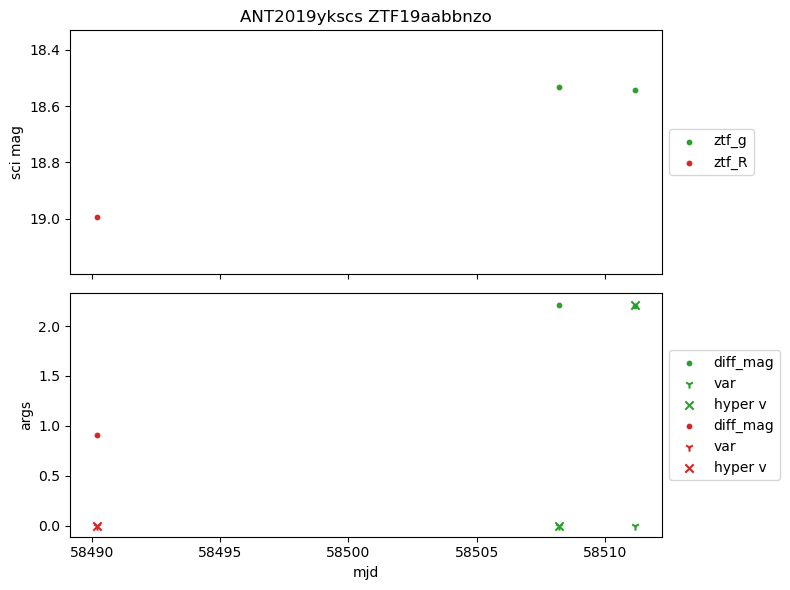

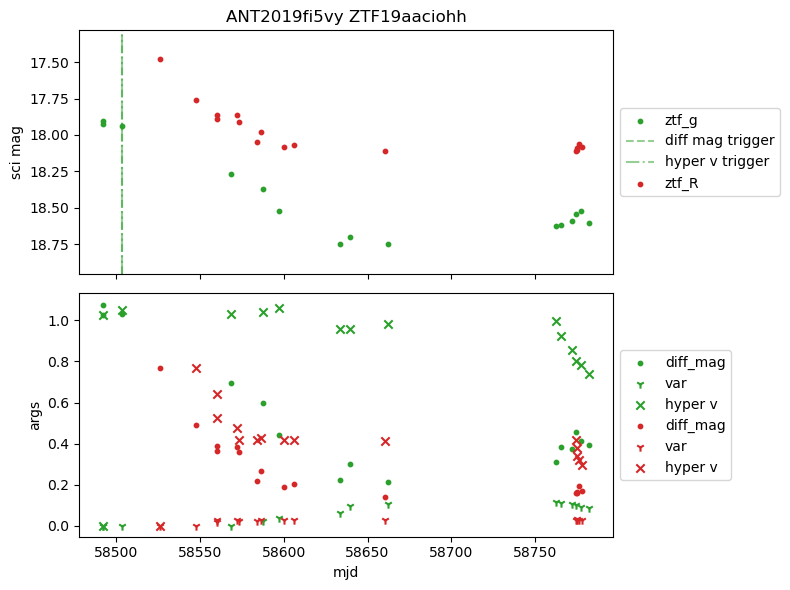

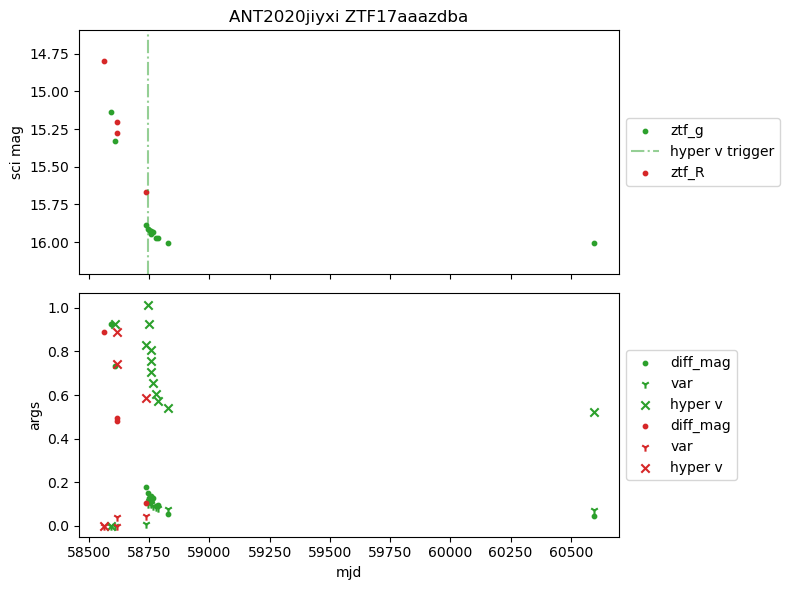

...

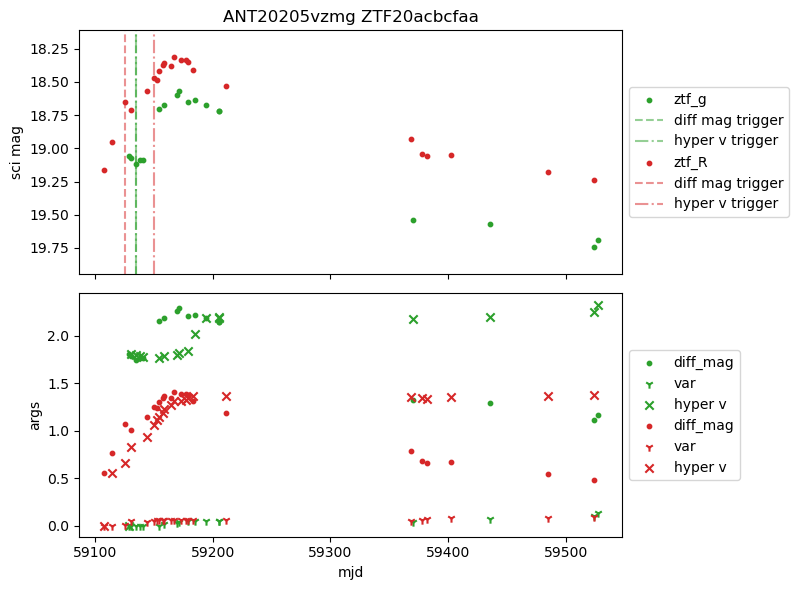

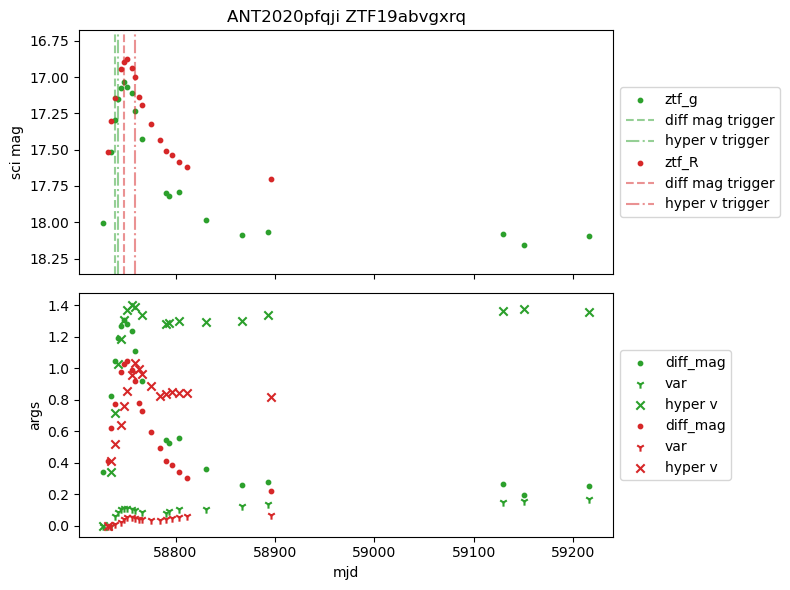

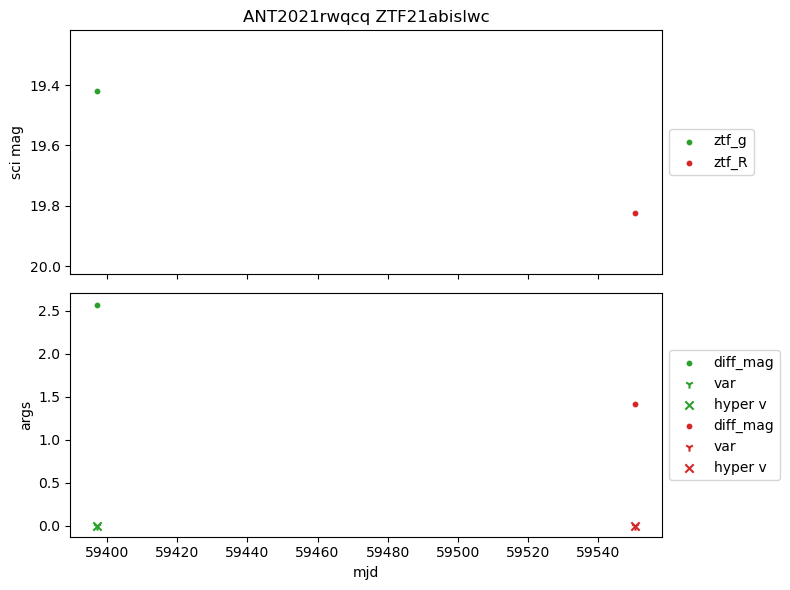

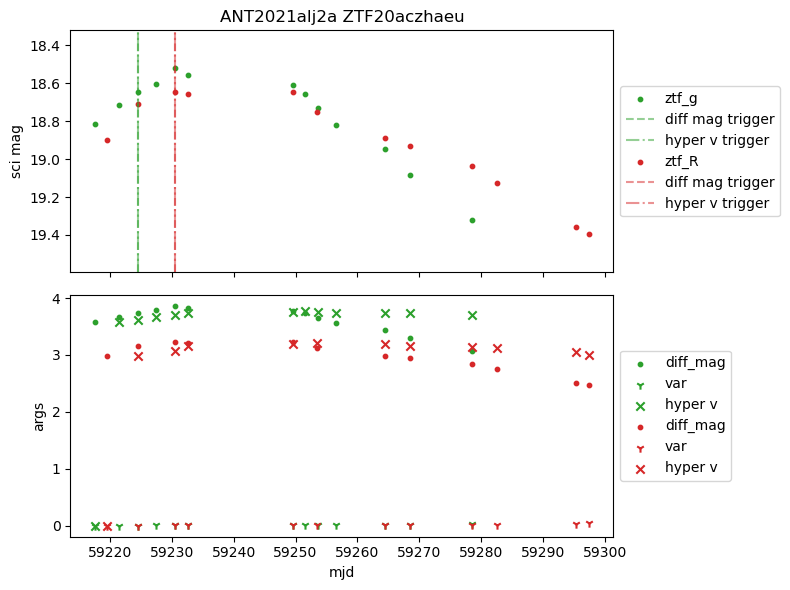

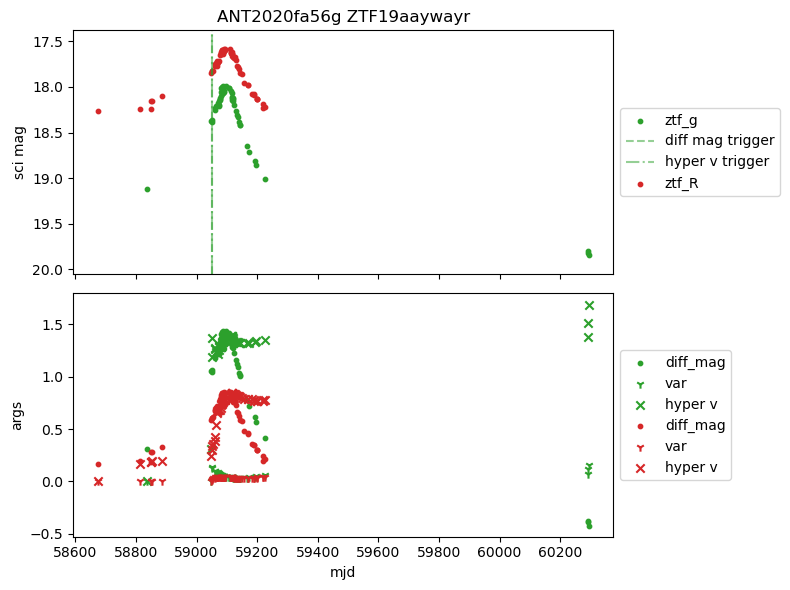

In [421]:
print('true and false positives from Yao et al 2023 paper')
colors = {'lsst_g': 'tab:blue', 'lsst_r': 'tab:orange', 'lsst_i': 'tab:brown', 'lsst_z': 'tab:pink', 'lsst_u': 'tab:olive', 
          'lsst_y': 'tab:cyan' ,'ztf_g': 'tab:green', 'ztf_R': 'tab:red', 'ztf_i': 'tab:purple'}
for key in windows_8k_hvc7:
    fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)
    max_mags = []
    min_mags = []
    for band in windows_8k_hvc7[key]:
        if isinstance(windows_8k_hvc7[key][band], pd.DataFrame) == 0:
            continue

        max_mags.append(max(windows_8k_hvc7[key][band]['oid_mag']))
        min_mags.append(min(windows_8k_hvc7[key][band]['oid_mag']))

        ax[0].scatter(windows_8k_hvc7[key][band]['mjd'], windows_8k_hvc7[key][band]['oid_mag'], s=10, label=band, color=colors[band])
        ax[1].scatter(windows_8k_hvc7[key][band]['mjd'], windows_8k_hvc7[key][band]['diff_mag'], s=10, label='diff_mag', color=colors[band])
        ax[1].scatter(windows_8k_hvc7[key][band]['mjd'], windows_8k_hvc7[key][band]['var'], marker='1', label='var', color=colors[band])
        ax[1].scatter(windows_8k_hvc7[key][band]['mjd'], windows_8k_hvc7[key][band]['hyper_v'], marker='x', label='hyper v', color=colors[band])

        # trig_dm_i = list(x > 1 for x in windows[key][band]['diff_mag'][2:]).index(True)
        trig_diff_mag = windows_8k_hvc7[key][band]['diff_mag'][2:] > 1
        if trig_diff_mag.sum() > 0:
            trig_dmi = list(trig_diff_mag).index(True) + 2
            ax[0].axvline(windows_8k_hvc7[key][band]['mjd'][trig_dmi], 0, 2.5, ls='--', c=colors[band], label='diff mag trigger', alpha=0.5)
        
        trig_var = windows_8k_hvc7[key][band]['var'][2:] > 0.4
        if trig_var.sum() > 0:
            trig_vari = list(trig_var).index(True) + 2
            ax[0].axvline(windows_8k_hvc7[key][band]['mjd'][trig_vari], 0, 2.5, ls=':', c=colors[band], label='var trigger', alpha=0.5)
            
        trig_hyperv = windows_8k_hvc7[key][band]['hyper_v'][2:] > 1
        if trig_hyperv.sum() > 0:
            trig_hypervi = list(trig_hyperv).index(True) + 2
            ax[0].axvline(windows_8k_hvc7[key][band]['mjd'][trig_hypervi], 0, 2.5, ls='-.', c=colors[band], label='hyper v trigger', alpha=0.5)
        
    ax[0].set_ylim([max(max_mags)+0.2, min(min_mags)-0.2])
    ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # ax[1].axhline(y=1, c='k', alpha=0.5)
    # ax[1].axhline(y=0.4, c='b', alpha=0.5)
    
    ax[0].set_title(key)
    ax[0].set_ylabel('sci mag')
    ax[1].set_ylabel('args')
    ax[1].set_xlabel('mjd')
    plt.tight_layout()

true and false positives from Yao et al 2023 paper


/var/folders/ym/gbj1z46s0wg5zdmkkq0xpptr0000gs/T/ipykernel_6520/1169939232.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)


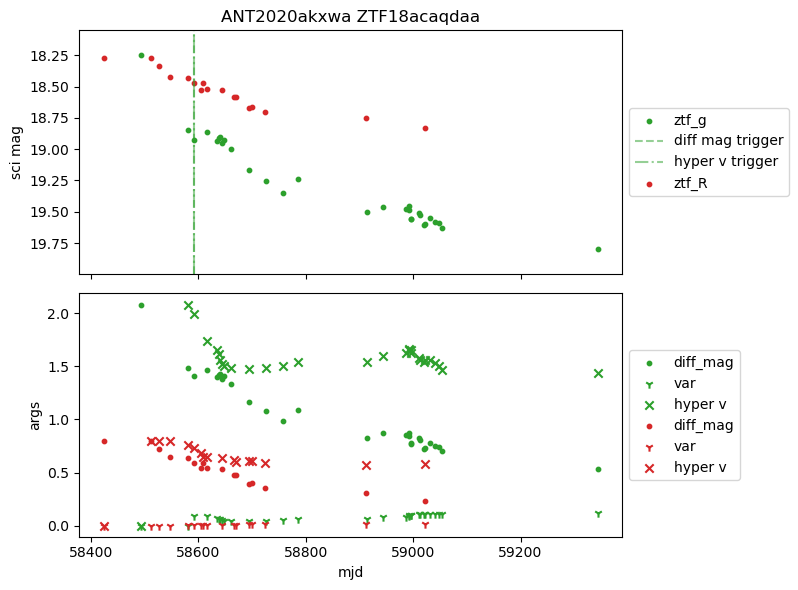

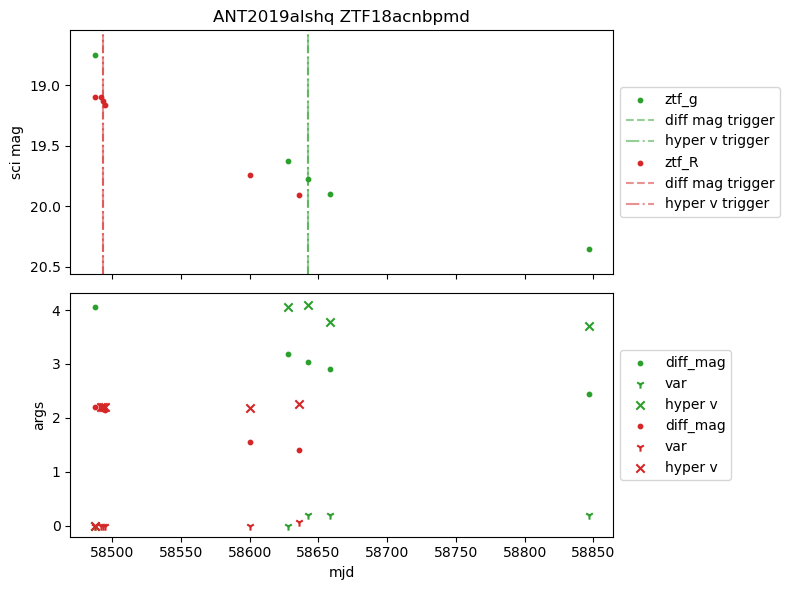

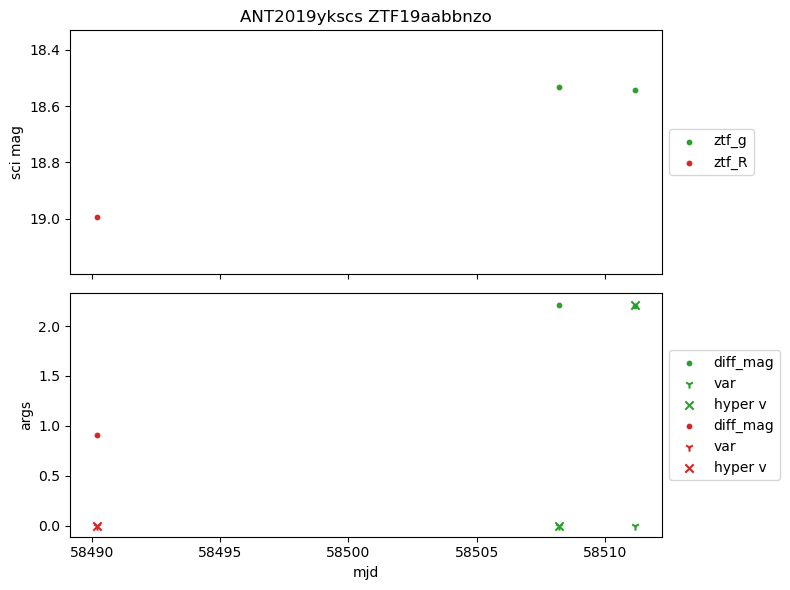

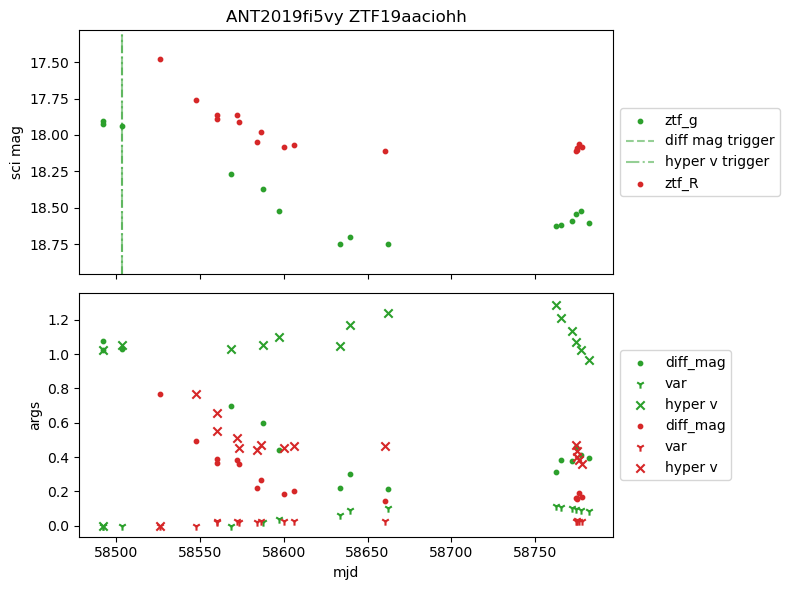

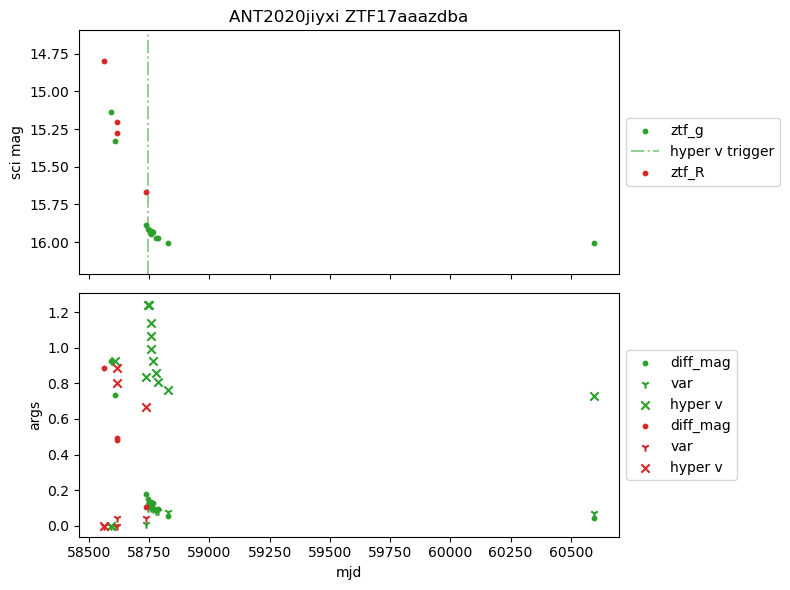

...

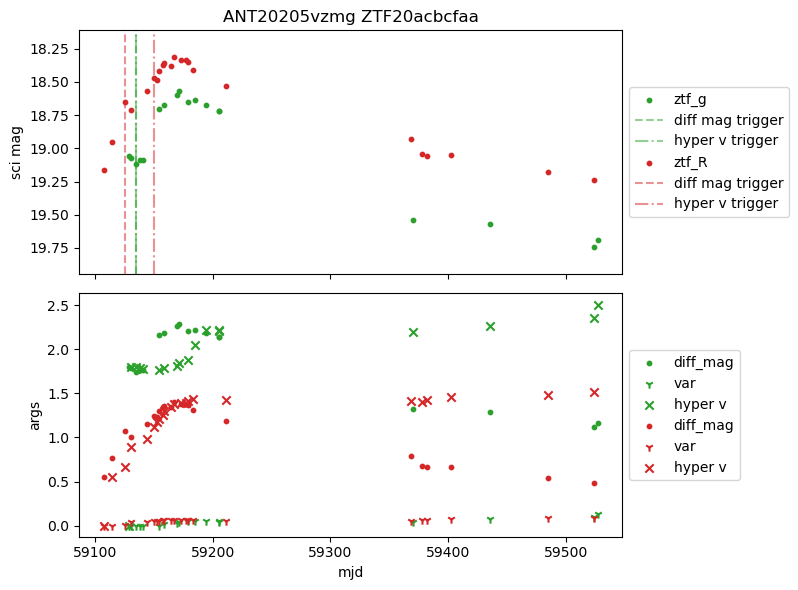

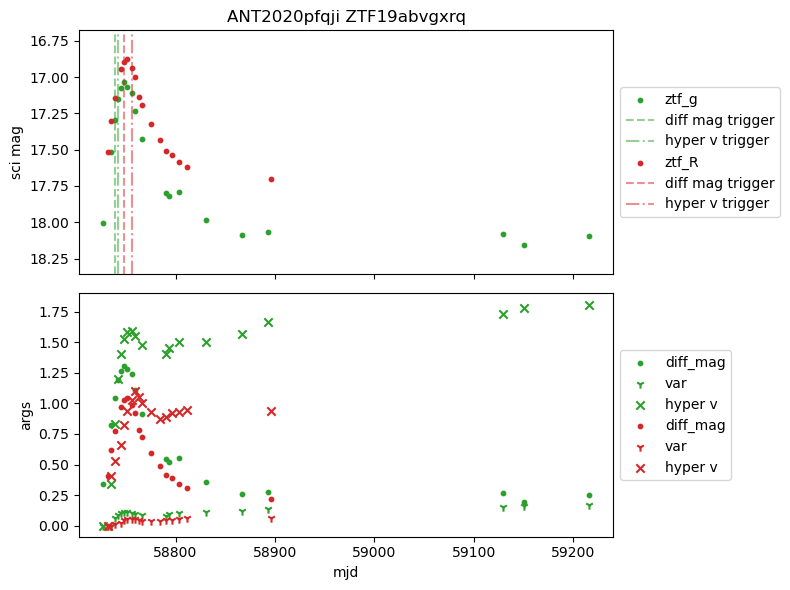

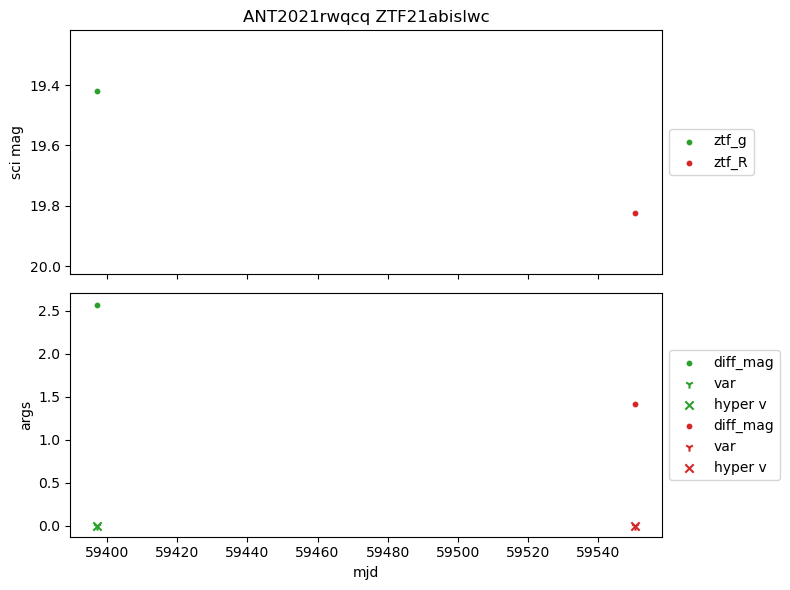

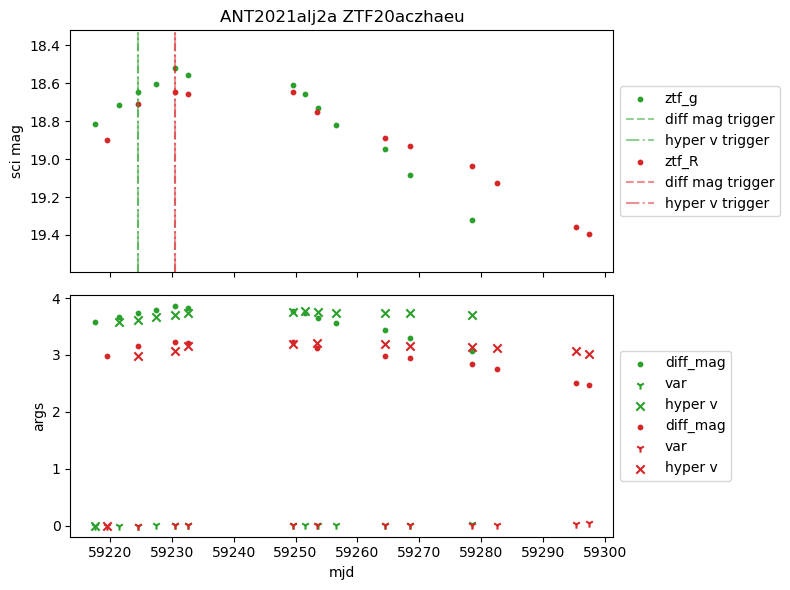

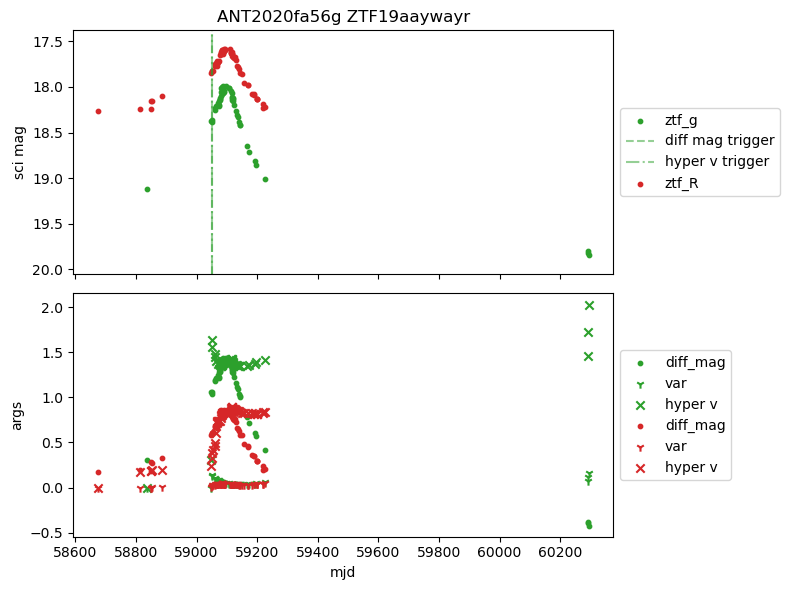

In [422]:
print('true and false positives from Yao et al 2023 paper')
colors = {'lsst_g': 'tab:blue', 'lsst_r': 'tab:orange', 'lsst_i': 'tab:brown', 'lsst_z': 'tab:pink', 'lsst_u': 'tab:olive', 
          'lsst_y': 'tab:cyan' ,'ztf_g': 'tab:green', 'ztf_R': 'tab:red', 'ztf_i': 'tab:purple'}
for key in windows_8k_hvc10:
    fig, ax = plt.subplots(2, 1, figsize=(8,6), sharex=True)
    max_mags = []
    min_mags = []
    for band in windows_8k_hvc10[key]:
        if isinstance(windows_8k_hvc10[key][band], pd.DataFrame) == 0:
            continue

        max_mags.append(max(windows_8k_hvc10[key][band]['oid_mag']))
        min_mags.append(min(windows_8k_hvc10[key][band]['oid_mag']))

        ax[0].scatter(windows_8k_hvc10[key][band]['mjd'], windows_8k_hvc10[key][band]['oid_mag'], s=10, label=band, color=colors[band])
        ax[1].scatter(windows_8k_hvc10[key][band]['mjd'], windows_8k_hvc10[key][band]['diff_mag'], s=10, label='diff_mag', color=colors[band])
        ax[1].scatter(windows_8k_hvc10[key][band]['mjd'], windows_8k_hvc10[key][band]['var'], marker='1', label='var', color=colors[band])
        ax[1].scatter(windows_8k_hvc10[key][band]['mjd'], windows_8k_hvc10[key][band]['hyper_v'], marker='x', label='hyper v', color=colors[band])

        # trig_dm_i = list(x > 1 for x in windows[key][band]['diff_mag'][2:]).index(True)
        trig_diff_mag = windows_8k_hvc10[key][band]['diff_mag'][2:] > 1
        if trig_diff_mag.sum() > 0:
            trig_dmi = list(trig_diff_mag).index(True) + 2
            ax[0].axvline(windows_8k_hvc10[key][band]['mjd'][trig_dmi], 0, 2.5, ls='--', c=colors[band], label='diff mag trigger', alpha=0.5)
        
        trig_var = windows_8k_hvc10[key][band]['var'][2:] > 0.4
        if trig_var.sum() > 0:
            trig_vari = list(trig_var).index(True) + 2
            ax[0].axvline(windows_8k_hvc10[key][band]['mjd'][trig_vari], 0, 2.5, ls=':', c=colors[band], label='var trigger', alpha=0.5)
            
        trig_hyperv = windows_8k_hvc10[key][band]['hyper_v'][2:] > 1
        if trig_hyperv.sum() > 0:
            trig_hypervi = list(trig_hyperv).index(True) + 2
            ax[0].axvline(windows_8k_hvc10[key][band]['mjd'][trig_hypervi], 0, 2.5, ls='-.', c=colors[band], label='hyper v trigger', alpha=0.5)
        
    ax[0].set_ylim([max(max_mags)+0.2, min(min_mags)-0.2])
    ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # ax[1].axhline(y=1, c='k', alpha=0.5)
    # ax[1].axhline(y=0.4, c='b', alpha=0.5)
    
    ax[0].set_title(key)
    ax[0].set_ylabel('sci mag')
    ax[1].set_ylabel('args')
    ax[1].set_xlabel('mjd')
    plt.tight_layout()